Μάριος Κερασιώτης | 03117890

-----

In [1]:
# in case of running this colab install dependencies:
# !pip install -U tabulate seaborn matplotlib numpy networkx pandas ipython

# 1<sup>η</sup> Εργαστηριακή Άσκηση
## Ανάλυση & Μελέτη Σύνθετων Τοπολογιών Δικτύου

<p style='text-align: justify;'> Στην παρούσα άσκηση θα δημιουργηθούν και θα αναλυθούν τοπολογίες, ορισμένες από τις οποίες χρησιμοποιούνται για την αναπαράσταση σύνθετων ή/και κοινωνικών δικτύων. Η ανάλυση θα γίνει μέσω των μετρικών ανάλυσης που παρουσιάστηκαν στις διαλέξεις του μαθήματος. Τα δίκτυα που θα μελετηθούν δίνονται στον Πίνακα 1.</p>

<table width="80%">
    <caption>Πίνακας $1$: Σύνθετα δίκτυα και χαρακτηριστικές παράμετροι</caption>
    <thead>
    <tr>
        <th>Τύπος Δικτύου</th>
        <th>Μοντέλο</th>
        <th>Αναγνωριστικό</th>
        <th>Παράμετροι</th>
    </tr>
    </thead>
    <tbody>
        <tr>
            <td style="background-color:#F2F4F7" rowspan="2">Πλέγμα</td>
            <td style="background-color:#F2F4F7" rowspan="2">Πεπερασμένο</td>
            <td style="background-color:#F2F4F7" rowspan="2">REG</td>
            <td style="background-color:#F2F4F7">Κόμβοι $n$</td>   
        </tr>
        <tr>
            <td style="background-color:#F2F4F7">Bαθμός $d$</td>
        </tr>
        <tr>
            <td style="background-color:#FFFFFF" rowspan="2">Τυχαίος γραφος</td>
            <td style="background-color:#FFFFFF" rowspan="2">Erdos-Renyi</td>
            <td style="background-color:#FFFFFF" rowspan="2">RG (ER)</td>
            <td style="background-color:#FFFFFF">Κόμβοι $n$</td>   
        </tr>
        <tr>
            <td style="background-color:#FFFFFF">Συνδέσεις $M$</td>
        </tr>
        <tr>
            <td style="background-color:#F2F4F7" rowspan="2">Τυχαίος γράφος</td>
            <td style="background-color:#F2F4F7" rowspan="2">Gilbert</td>
            <td style="background-color:#F2F4F7" rowspan="2">RG (G)</td>
            <td style="background-color:#F2F4F7">Κόμβοι $n$</td>   
        </tr>
        <tr>
            <td style="background-color:#F2F4F7">Πιθανότητα σύνδεσης $p$</td>
        </tr>
        <tr>
            <td style="background-color:#FFFFFF" rowspan="3">Τυχαίος γεωμετρικός γράφος</td>
            <td style="background-color:#FFFFFF" rowspan="3">Επίπεδος</td>
            <td style="background-color:#FFFFFF" rowspan="3">RGG</td> 
        </tr>
        <tr>
            <td style="background-color:#FFFFFF" >Ακτίνα $R$</td>
        </tr>
        <tr>
            <td style="background-color:#FFFFFF">Κόμβοι $n$</td>  
        </tr>
        <tr>
            <td style="background-color:#F2F4F7" rowspan="2">Scale-free</td>
            <td style="background-color:#F2F4F7" rowspan="2">Barabasi-Albert</td>
            <td style="background-color:#F2F4F7" rowspan="2">SF (BA)</td>
            <td style="background-color:#F2F4F7">Κόμβοι $n$</td>   
        </tr>
        <tr>
            <td style="background-color:#F2F4F7">Παράμετρος επισύναψης $d$</td>
        </tr>
        <tr>
            <td style="background-color:#FFFFFF" rowspan="3">Small-world</td>
            <td style="background-color:#FFFFFF" rowspan="3">Watts-Strogatz</td>
            <td style="background-color:#FFFFFF" rowspan="3">SW (WS)</td>
            <td style="background-color:#FFFFFF">Κόμβοι $n$ </td>   
        </tr>
        <tr>
            <td style="background-color:#FFFFFF" >Βαθμός αρχικού πλέγματος $d$</td>
        </tr>
        <tr>
            <td style="background-color:#FFFFFF">Πιθανότητα ανασύνδεσης $g_p$</td>  
        </tr>
    </tbody>
</table>

In [2]:
seedno = 600  #seed number !DO NOT CHANGE IT!

In [3]:
import csv
import itertools
import random
import textwrap
from functools import reduce

import matplotlib
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import seaborn as sns
from IPython.display import Markdown, display, display_html
from tabulate import tabulate

# matplotlib configuration
%matplotlib inline
plt.rcParams["figure.figsize"] = (10, 10)
matplotlib.rcParams["figure.dpi"] = 300
sns.set_palette('cubehelix')
sns.set()

## Α. Κατασκευή και οπτικοποίηση σύνθετων τύπων δικτύου

### Τοπολογία REG για βαθμό πλέγματος $d = 4$

Για την τοπολογία REG καλούμε την συνάρτηση με n = n, k = d και p = 0 διότι θέλουμε ο κάθε κόμβος να έχει τον ίδιο αριθμό γειτόνων.

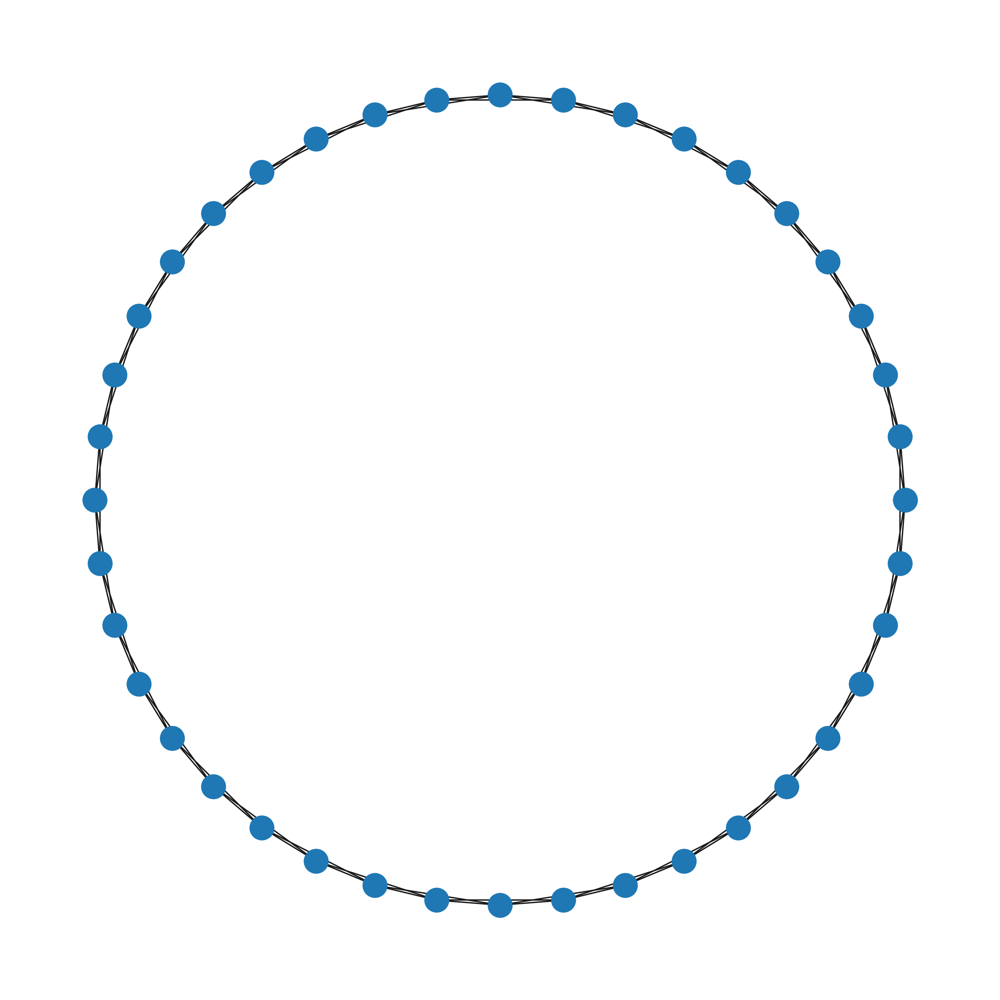

In [4]:
random.seed(seedno)
#n=4x μέγεθος δικτύου: αντικαταστήστε το x με το τελευταίο ψηφίο του αριθμού μητρώου σας.
n = 40
d = 4
# για την κατασκευή του REG χρησιμοποιήστε την watts_strogatz_graph από το networkx.
# Επιλέξτε προσεκτικά την τιμή της παραμέτρου p.
REG = nx.watts_strogatz_graph(n=n, k=d, p=0, seed=seedno)
#οπτικοποίηση: χρησιμοποιήστε την draw_circular από το networkx
nx.draw_circular(REG)

### Τοπολογία RG (ER) για αριθμό συνδέσεων $M = 150$

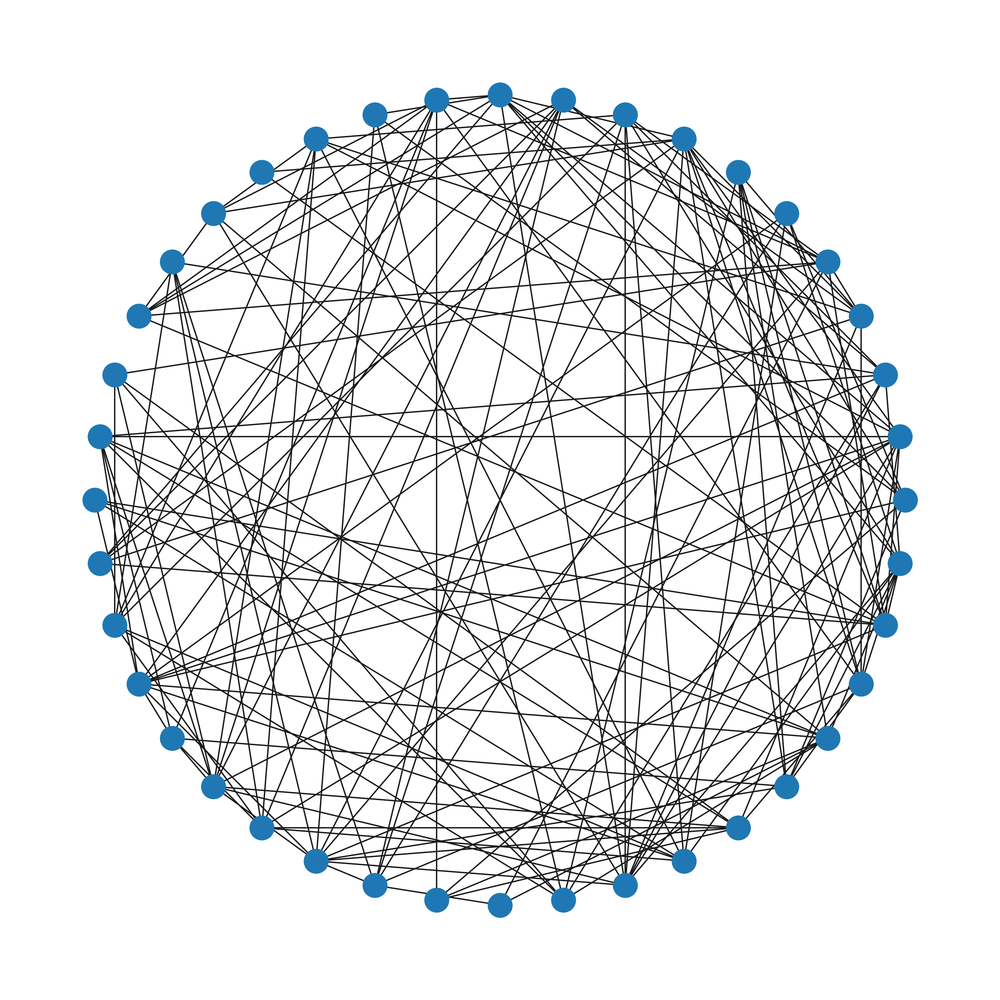

In [5]:
random.seed(seedno)
#n=4x
n = 40
M = 150

# για την κατασκευή του RGER χρησιμοποιήστε την gnm_random_graph από το networkx
RGER = nx.gnm_random_graph(n, M, seed=seedno)

# οπτικοποίηση: χρησιμοποιήστε την draw_circular από το networkx
nx.draw_circular(RGER)

### Τοπολογία RGG  με ακτίνα σύνδεσης $R=0.35$

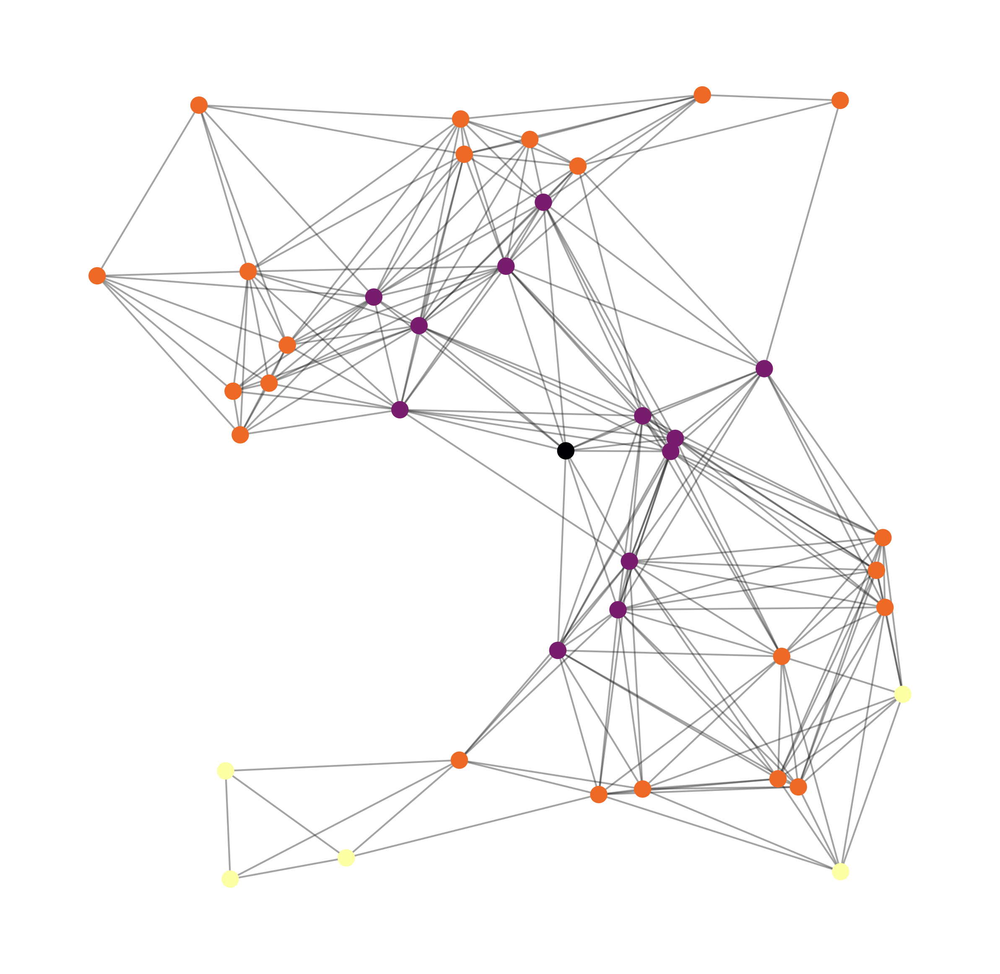

In [6]:
random.seed(seedno)
#n=4x
n = 40
R = 0.35

# για την κατασκευή του RGG χρησιμοποιήστε την random_geometric_graph από το networkx
RGG = nx.random_geometric_graph(n, R, seed=seedno)

#οπτικοποίηση: https://networkx.org/documentation/stable/auto_examples/drawing/plot_random_geometric_graph.html
pos = nx.get_node_attributes(RGG, "pos")

# find node near center (0.5,0.5)
dmin = 1
ncenter = 0
for n in pos:
    x, y = pos[n]
    d = (x - 0.5)**2 + (y - 0.5)**2
    if d < dmin:
        ncenter = n
        dmin = d

# color by path length from node near center
p = dict(nx.single_source_shortest_path_length(RGG, ncenter))

plt.figure()
plt.box(False)
nx.draw_networkx_edges(RGG, pos, alpha=0.4)
nx.draw_networkx_nodes(
    RGG,
    pos,
    nodelist=list(p.keys()),
    node_size=80,
    node_color=list(p.values()),
    cmap=plt.cm.inferno,
)

### Τοπολογία SF με παράμετρο επισύναψης $d=4$

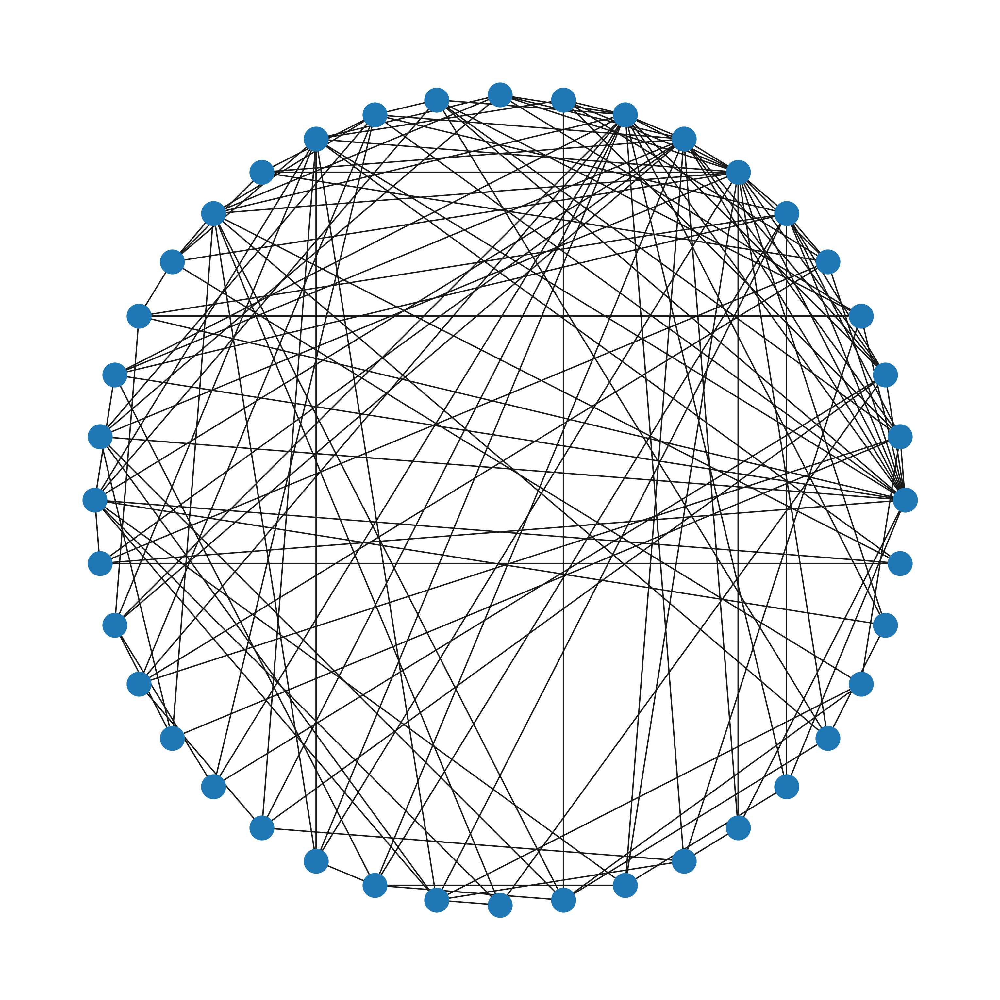

In [7]:
random.seed(seedno)
#n=4x
n = 40
d = 4

# για την κατασκευή του SF χρησιμοποιήστε την barabasi_albert_graph από το networkx
SF = nx.barabasi_albert_graph(n, d, seed=seedno)

#οπτικοποίηση: χρησιμοποιήστε την draw_circular από το networkx
nx.draw_circular(SF)

### Τοπολογία SW με βαθμό αρχικού πλέγματος $d=4$ και πιθανότητα ανασύνδεσης $p=0.25$

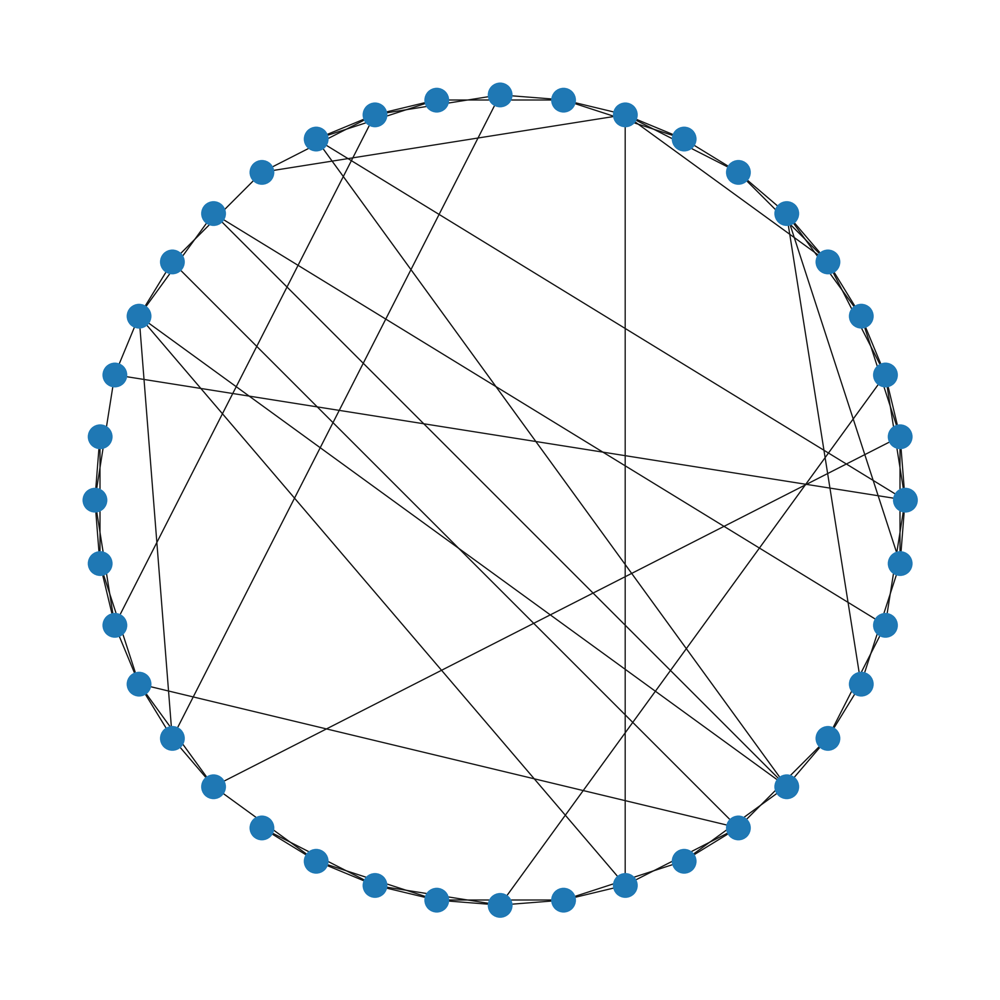

In [8]:
random.seed(seedno)
#n=4x
n = 40
d = 4
p = 0.25

# για την κατασκευή του SW χρησιμοποιήστε την watts_strogatz_graph από το networkx.
SW = nx.watts_strogatz_graph(n, d, p, seed=seedno)

#οπτικοποίηση: χρησιμοποιήστε την draw_circular από το networkx
nx.draw_circular(SW)

## B. Μετρικές δικτύου

### B1. Συντελεστής ομαδοποίησης (Clustering coefficient)

**Για κάθε μια από τις τοπολογίες REG, RG(ER), RGG, SF(BA) και SW(WS):**

#### Β1.1 Να υπολογιστεί ο συντελεστής ομαδοποίησης κάθε κόμβου και να αναπαρασταθεί η κατανομή του.

In [9]:
def cc(G):
    return nx.clustering(G)

In [10]:
topologies = {'REG': REG, 'RGER': RGER, 'RGG': RGG, 'SF': SF, 'SW': SW}


def plot_dist(values, xlabel):
    fig, axes = plt.subplots(2, 3)

    sns.histplot(values('REG'), ax=axes[0][0], kde=True)
    axes[0][0].set_title('REG')
    axes[0][0].set_xlabel(xlabel)

    sns.histplot(values('RGER'), ax=axes[0][1], kde=True)
    axes[0][1].set_title('RGER')
    axes[0][1].set_xlabel(xlabel)

    sns.histplot(values('RGG'), ax=axes[0][2], kde=True)
    axes[0][2].set_title('RGG')
    axes[0][2].set_xlabel(xlabel)

    sns.histplot(values('SF'), ax=axes[1][0], kde=True)
    axes[1][0].set_title('SF')
    axes[1][0].set_xlabel(xlabel)

    axes[1][1].set_visible(False)

    sns.histplot(values('SW'), ax=axes[1][2], kde=True)
    axes[1][2].set_title('SW')
    axes[1][2].set_xlabel(xlabel)


tabu = lambda table, headers: tabulate(table, headers, tablefmt="fancy_grid")


def side_by_side(dfs, names=[]):
    html_str = ''
    if names:
        html_str += ('<tr>' + ''.join(
            f'<td style="text-align:center">{name}</td>' for name in names) +
                     '</tr>')
    html_str += ('<tr>' + ''.join(
        f'<td style="vertical-align:top"> {df.to_html(index=False)}</td>'
        for df in dfs) + '</tr>')
    html_str = f'<table>{html_str}</table>'
    html_str = html_str.replace('table', 'table style="display:inline"')
    display_html(html_str, raw=True)

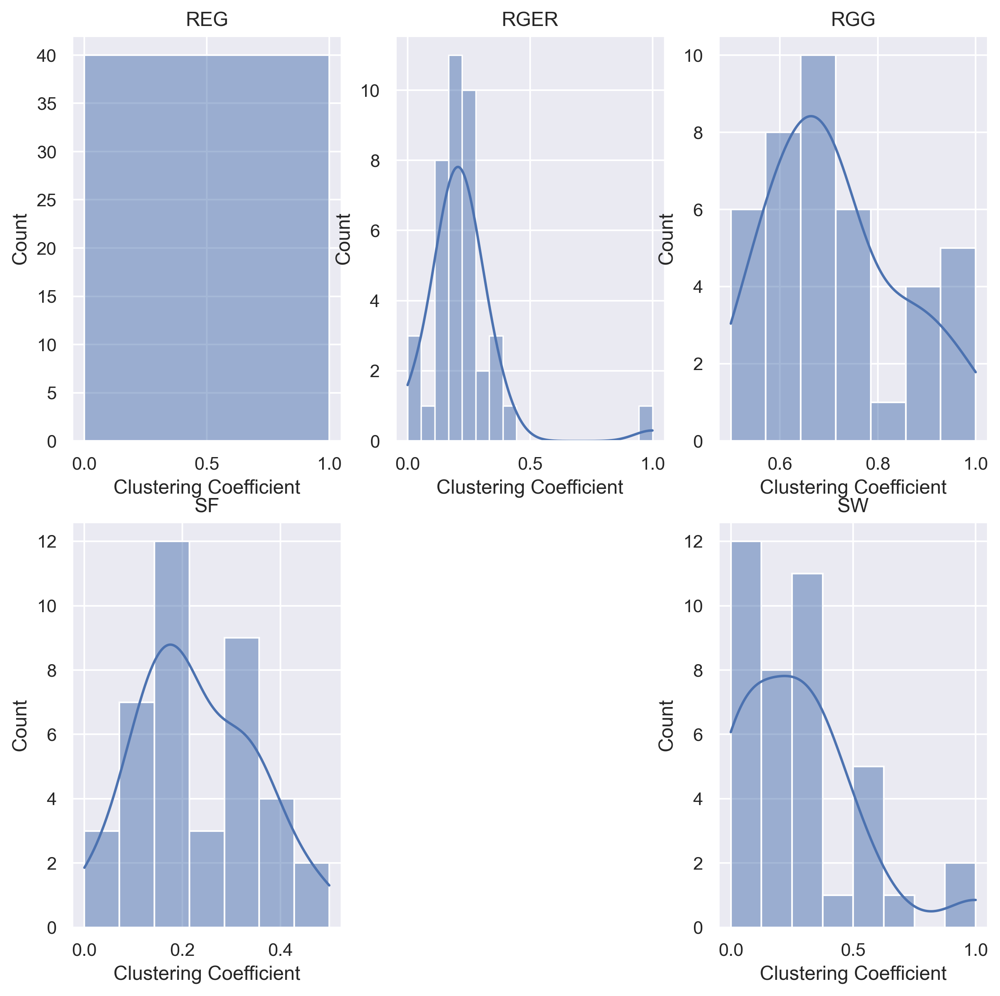

In [11]:
cc_topologies = {}
for name, topology in topologies.items():
    cc_topologies[name] = cc(topology)

values = lambda x: list(cc_topologies[x].values())
plot_dist(values, 'Clustering Coefficient')

#### Β1.2  Να υπολογιστεί ο μέσος συντελεστής ομαδοποίησης και η διασπορά του.

In [12]:
table = []
for key, value in cc_topologies.items():
    values = list(value.values())
    table.append([key, np.mean(values), np.var(values)])
headers = [
    'Topology', 'Mean Clustering Coefficient',
    'Variance of Clustering Coefficient'
]
print(tabu(table, headers))

╒════════════╤═══════════════════════════════╤══════════════════════════════════════╕
│ Topology   │   Mean Clustering Coefficient │   Variance of Clustering Coefficient │
╞════════════╪═══════════════════════════════╪══════════════════════════════════════╡
│ REG        │                      0.5      │                            0         │
├────────────┼───────────────────────────────┼──────────────────────────────────────┤
│ RGER       │                      0.2223   │                            0.023126  │
├────────────┼───────────────────────────────┼──────────────────────────────────────┤
│ RGG        │                      0.712006 │                            0.0172735 │
├────────────┼───────────────────────────────┼──────────────────────────────────────┤
│ SF         │                      0.227871 │                            0.0141168 │
├────────────┼───────────────────────────────┼──────────────────────────────────────┤
│ SW         │                      0.269167 │        

#### Β.1.3 Να βρεθούν οι κόμβοι με το μικρότερο και το μεγαλύτερο συντελεστή ομαδοποίησης. 

In [13]:
def get_nodes(method, topology):
    search_value = method(cc_topologies[topology].values())
    return (search_value, [
        key for key, value in cc_topologies[topology].items()
        if value == search_value
    ])

In [14]:
join_list = lambda x: ", ".join([str(i) for i in x])

for k in cc_topologies.keys():
    min_coef, min_nodes = get_nodes(min, k)
    max_coef, max_nodes = get_nodes(max, k)
    print("Nodes in {:4} with min. cc = {}:\n{}".format(k, min_coef,
                                                        join_list(min_nodes)))
    print("Nodes in {:4} with max. cc = {}:\n{}".format(k, max_coef,
                                                        join_list(max_nodes)))
    print()

Nodes in REG  with min. cc = 0.5:
0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39
Nodes in REG  with max. cc = 0.5:
0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39

Nodes in RGER with min. cc = 0:
29, 30
Nodes in RGER with max. cc = 1.0:
14

Nodes in RGG  with min. cc = 0.5:
28
Nodes in RGG  with max. cc = 1.0:
7, 8

Nodes in SF   with min. cc = 0:
24, 37
Nodes in SF   with max. cc = 0.5:
34

Nodes in SW   with min. cc = 0:
10, 14, 16, 18, 32, 33, 34, 36, 38
Nodes in SW   with max. cc = 1.0:
19, 26



#### Να σχολιαστούν τα αποτελέσματα.

Ο Συντελεστής Ομαδοποίησης (Σ.Ο.) είναι μια μετρική για να ποσοτικοποιήσουμε την συσταδοποίηση του δικτύου μας. Παρατηρούμε πως για το πλέγμα (REG) ο Σ.Ο. κάθε κόμβου είναι σταθερός. Αυτό είναι αναμενόμενο διότι δεν υπάρχει τυχαιότητα και κάθε κόμβος συνδέεται με 4 άλλους κόμβους σταθερά. Ακόμη παρατηρούμε η διασπορά του Σ.Ο. είναι 0, κάτι το οποίο είναι λογικό εφόσον όλοι οι κόμβοι έχουν σταθερά Σ.Ο. ίσο με 0.5, κάτι το οποίο επίσης αιτιολογεί το γεγονός πως στο REG στους κόμβους με τον μεγαλύτερο και μικρότερο συντελεστή ομαδοποίησης έχουμε τυπώσει όλους τους κόμβους και στις δύο περιπτώσεις. Για την τοπολογία RG(ER) παρατηρούμε πως έχει κατά μέσο όρο μικρό Σ.Ο., κάτι το οποίο οφείλεται στο γεγονός πως η πιθανότητα ένας κόμβος να έχει έναν βαθμό ακολουθεί την κατανομή Poisson, με αποτέλεσμα κάποιοι κόμβοι διάσπαρτα στην κατανομή να συνδέονται με πολλούς άλλους και οι υπόλοιποι να έχουν λίγες συνδέσεις. Όσον αφορά στο RGG παρατηρούμε πως κατά μέσο όρο έχει τον μεγαλύτερο συντελεστή ομαδοποίησης. Αυτό μπορεί να οφείλεται στον τρόπο που κατασκευάζεται, δηλαδή στο γεγονός πως οι κόμβοι τοποθετούνται και συνδέονται με άλλους κόμβους- γείτονες που βρίσκονται μέσα στην ακτίνα R, με αποτέλεσμα η πλειοψηφία των κόμβων να συνδέονται με τους άλλους κόμβους, δημιουργώντας έτσι συστάδες. Τέλος, για τα SF και SW παρατηρούμε πως έχουν σχετικά μικρό Σ.Ο., κάτι το οποίο πιθανώς να οφείλεται στο οτι οι τοπολογίες αυτές είτε έχουν κόμβους οι οποίοι συνήθως δεν είναι γείτονες μεταξύ τους, αλλά οι περισσότεροι από αυτούς μπορούν να προσεγγισθούν από όλους τους υπόλοιπους με ένα μικρό αριθμό "βημάτων" (SW), είτε έχουν κόμβους όπου ένα μικρό ποσοστό αυτών συνδέονται με πολλούς άλλους, ενώ το μεγαλύτερο ποσοστό αυτών συνδέονται με λίγους άλλους κόμβους (SF).

### Β2. Μέσο μήκος μονοπατιού - Διάμετρος - Ακτίνα γράφου

**Για κάθε μια από τις τοπολογίες REG, RG(ER), RGG, SF(BA) και SW(WS):**

#### Β2.1 Nα υπολογιστεί το μέσο μήκος μονοπατιού και η διασπορά του. Προτείνεται η χρήση της συνάρτησης  all_pairs_shortest_path_length του networkx.

In [15]:
def compute_path_lengths(G):
    lengths = []
    shortest_paths = list(nx.all_pairs_shortest_path_length(G))
    for n, paths in shortest_paths:
        del paths[n]  # remove the 0 from the same node
        lengths.extend(list(paths.values()))
    return lengths

In [16]:
table = []
path_lengths_topologies = {}
for name, G in topologies.items():
    path_length = compute_path_lengths(G)
    path_lengths_topologies[name] = path_length
    mean = np.mean(path_length)
    var = np.var(path_length)

    table.append([name, mean, var])
    assert abs(np.mean(path_length) - nx.average_shortest_path_length(G)
              ) <= 0.000001, "Average path length is incorrect"

headers = ['Topology', 'Mean Path Length', 'Variance of Path Length']
print(tabu(table, headers))

╒════════════╤════════════════════╤═══════════════════════════╕
│ Topology   │   Mean Path Length │   Variance of Path Length │
╞════════════╪════════════════════╪═══════════════════════════╡
│ REG        │            5.38462 │                  7.92899  │
├────────────┼────────────────────┼───────────────────────────┤
│ RGER       │            1.98974 │                  0.376818 │
├────────────┼────────────────────┼───────────────────────────┤
│ RGG        │            2.28077 │                  1.13527  │
├────────────┼────────────────────┼───────────────────────────┤
│ SF         │            1.99103 │                  0.36274  │
├────────────┼────────────────────┼───────────────────────────┤
│ SW         │            2.97564 │                  1.21607  │
╘════════════╧════════════════════╧═══════════════════════════╛


#### B2.2 Να υπολογιστεί η διάμετρος (συνάρτηση diameter) και η ακτίνα (συνάρτηση radius).

In [17]:
diameter_topologies = {}
table = []
for name, topology in topologies.items():
    diameter_topologies[name] = nx.diameter(topology)
    table.append([name, nx.diameter(topology), nx.radius(topology)])

headers = ['Topology', 'Diameter', 'Radius']
print(tabu(table, headers))

╒════════════╤════════════╤══════════╕
│ Topology   │   Diameter │   Radius │
╞════════════╪════════════╪══════════╡
│ REG        │         10 │       10 │
├────────────┼────────────┼──────────┤
│ RGER       │          4 │        2 │
├────────────┼────────────┼──────────┤
│ RGG        │          5 │        3 │
├────────────┼────────────┼──────────┤
│ SF         │          4 │        2 │
├────────────┼────────────┼──────────┤
│ SW         │          6 │        4 │
╘════════════╧════════════╧══════════╛


#### Για τα παραπάνω πραγματοποιήστε συγκρίσεις και εξηγήστε με βάση τα χαρακτηριστικά της κάθε τοπολογίας όπως παρουσιάζονται στη θεωρία.

Παρατηρούμε πως το μεγαλύτερο μέσο μήκος μονοπατιού και την μεγαλύτερη διασπορά τα έχει η τοπολογία REG, κάτι το οποίο είναι αναμενόμενο εφόσον κάθε κόμβος συνδέεται με 4 γείτονες και φτάνει μέσω αυτών στους πιο απομακρυσμένους κόμβους, με αποτέλεσμα να μην μπορεί να δημιουργηθεί σύντομο μονοπάτι. Επίσης παρατηρούμε πως έχει την μεγαλύτερη διάμετρο (μέγιστη εκκεντρότητα) και την μεγαλύτερη ακτίνα (ελάχιστη εκκεντρότητα), τα οποία είναι και ίσα μεταξύ τους, που επίσης είναι αναμενόμενο δεδομένης της μορφολογίας της τοπολογίας.

Στην συνέχεια για το RGER περιμένουμε σχετικά μικρό μέσο μήκος μονοπατιού, και πράγματι παρατηρούμε ότι έχει σχετικά μικρό, καθώς μικρή είναι και η διασπορά. Αυτό πιθανώς να οφείλεται στο πλήθος των ακμών, καθώς όσο αυξάνεται ο μέσος βαθμός σε ένα τυχαίο γράφημα, τόσο μεγαλώνει και το giant component του δημιουργώντας έτσι συντομότερα μονοπάτια. Αυτός είναι και ο λόγος που η διάμετρος, που είναι η μέγιστη εκκεντρότητα, και η ακτίνα, που είναι η ελάχιστη εκκεντρότητα, είναι τόσο μικρότερες αναλογικά με αυτές του REG. 

Για το RGG, τώρα, περιμένουμε σχετικά μεγάλο μέσο μήκος μονοπατιού, κάτι το οποίο, ωστόσο, εξαρτάται από τις αποστάσεις μεταξύ των κόμβων και την τιμή της παραμέτρου r. Όσο μεγαλύτερο είναι το r, τόσο περισσότερο γίνεται εφικτό να δημιουργούνται ακμές μεταξύ σχετικά μεγάλων αποστάσεων, με αποτέλεσμα το μέσο μήκος μονοπατιού να γίνεται σχετικά μικρό. Στην περίπτωσή μας παρατηρούμε ότι πράγματι έχει σχετικά μικρό μέσο μήκους μονοπατιού, αλλά σχετικά μεγάλο variance. Η διάμετρος και η ακτίνα είναι σαφώς μικρότερες από αυτές του REG, κάτι το οποίο είναι λογικό με βάση αυτά που εξηγήσαμε.

Για το SF περιμένουμε πολύ μικρό μέσο μήκος μονοπατιού, και πράγματι λαμβάνουμε το μικρότερο από όλα, όπως επίσης λαμβάνουμε πολύ μικρή διασπορά για το μέσο μήκος μονοπατιού, κάτι που εξηγεί πως οι περισσότεροι κόμβοι είτε είναι κόμβοι μεγάλου βαθμού είτε συνδέονται με ένα hop με κόμβο μεγάλου βαθμού. Επίσης, λογικό να έχουμε την μικρότερη διάμετρο και ακτίνα. 

Τέλος, για το SW, από την θεωρία περιμένουμε να έχει μικρό μέσο μήκος μονοπατιού, και όντως ισχύει ότι έχει σχετικά μικρό καθώς και η διασπορά είναι περίπου ίδια με αυτή του RGG, όπως παρατηρούμε να είναι και η διάμετρος και η ακτίνα αυτών των δύο τοπολογιών, στα δεδομένα που έχουμε εμείς.

#### B.2.3 Για κάθε τοπολογία, ποιος κόμβος συνδέεται με τους περισσότερους κόμβους με μήκος ελάχιστου μονοπατιού ίσο με τη διάμετρο της τοπολογίας?

In [18]:
def find_nodes(G):
    diam = nx.diameter(G)
    paths_equal_to_diameter = {}
    shortest_paths = list(nx.all_pairs_shortest_path_length(G))
    for n, paths in shortest_paths:
        paths_equal_to_diameter[n] = list(paths.values()).count(diam)
    max_key = max(paths_equal_to_diameter, key=paths_equal_to_diameter.get)
    max_value = paths_equal_to_diameter[max_key]
    max_key = [
        str(k) for k, v in paths_equal_to_diameter.items() if v >= max_value
    ]
    return (", ".join(max_key), max_value, diam)

In [19]:
# να προσδιοριστεί το label του κόμβου και το σύνολο των κόμβων
# με τους οποίους συνδέεται με μήκος ελάχιστου μονοπατιού ΄ίσο με τη διάμετρο.
table = []

for name, G in topologies.items():
    node, value, diam = find_nodes(G)
    table.append([name, diam, textwrap.fill(node, 40), value])
headers = ['Topology', 'Diameter', 'Nodes', 'n']
print(tabu(table, headers))

╒════════════╤════════════╤═════════════════════════════════════════╤═════╕
│ Topology   │   Diameter │ Nodes                                   │   n │
╞════════════╪════════════╪═════════════════════════════════════════╪═════╡
│ REG        │         10 │ 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,   │   3 │
│            │            │ 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, │     │
│            │            │ 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, │     │
│            │            │ 32, 33, 34, 35, 36, 37, 38, 39          │     │
├────────────┼────────────┼─────────────────────────────────────────┼─────┤
│ RGER       │          4 │ 14, 22                                  │   1 │
├────────────┼────────────┼─────────────────────────────────────────┼─────┤
│ RGG        │          5 │ 5, 7, 8, 19, 34                         │   5 │
├────────────┼────────────┼─────────────────────────────────────────┼─────┤
│ SF         │          4 │ 25, 37                                  │   1 │
├───────────

#### Β.2.4 Για κάθε τοπολογία, να βρεθεί η περιφέρεια και το κέντρο της και να σχολιαστούν τα αποτελέσματα.

**Περιφέρεια του γράφου ορίζεται να είναι το σύνολο των κόμβων του που έχουν εκκεντρότητα ίση με τη διάμετρό του. Κέντρο του γράφου ορίζεται να είναι το σύνολο των κόμβων του που έχουν εκκεντρότητα ίση με την ακτίνα του.** 

In [20]:
def find_periphery(G):
    return nx.periphery(G)

In [21]:
def find_center(G):
    return nx.center(G)

In [22]:
table = []

for name, G in topologies.items():
    table.append([
        name,
        textwrap.fill(join_list(find_periphery(G)), 40),
        textwrap.fill(join_list(find_center(G)), 40)
    ])
headers = ['Topology', 'Nodes in the periphery', 'Nodes in the center']
print(tabu(table, headers))

╒════════════╤═════════════════════════════════════════╤═════════════════════════════════════════╕
│ Topology   │ Nodes in the periphery                  │ Nodes in the center                     │
╞════════════╪═════════════════════════════════════════╪═════════════════════════════════════════╡
│ REG        │ 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,   │ 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,   │
│            │ 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, │ 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, │
│            │ 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, │ 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, │
│            │ 32, 33, 34, 35, 36, 37, 38, 39          │ 32, 33, 34, 35, 36, 37, 38, 39          │
├────────────┼─────────────────────────────────────────┼─────────────────────────────────────────┤
│ RGER       │ 14, 22                                  │ 27                                      │
├────────────┼─────────────────────────────────────────┼─────────────────────────────────────────┤
│ RGG     

Όπως αναμέναμε, από τα παραπάνω παρατηρούμε πως ο REG έχει όλους τους κόμβους του και στην περιφέρεια αλλά και στο κέντρο του, πράγμα προφανές και αναμενόμενο. Για τον RGER βλέπουμε πως 2  κόμβοι βρίσκονται στην περιφέρεια και μόνο ένας στο κέντρο, κάτι το οποίο μάλλον οφείλεται στο πλήθος των ακμών, οι οποίες όπως εξηγήσαμε και παραπάνω, όσο αυξάνονται, τόσο μεγαλώνει ο βαθμός των κόμβων, και συνεπώς το giant component. Στην συνέχεια παρατηρούμε πως το RGG έχει 10 κόμβους τόσο στην περιφέρεια όσο και στο κέντρο του, δηλαδή λιγότερους από το REG, κάτι το οποίο πιθανώς να οφείλεται στην ακτίνα με την οποία το κατασκευάσαμε. Για το SF παρατηρούμε πως οι κόμβοι στο κέντρο είναι σχεδόν τριπλάσιοι των κόμβων στη περιφέρεια. Ενώ για τον SW παρατηρούμε πως είναι σχεδόν διπλάσιοι.

## Γ) Mετρικές κεντρικότητας κόμβων

### Γ1. Κεντρικότητα βαθμού (Degree centrality)

##### Γ1.1 Να αναπαρασταθεί η κατατανομή βαθμών κόμβων για κάθε τοπολογία.

In [23]:
def find_degree(G):
    return dict(G.degree())

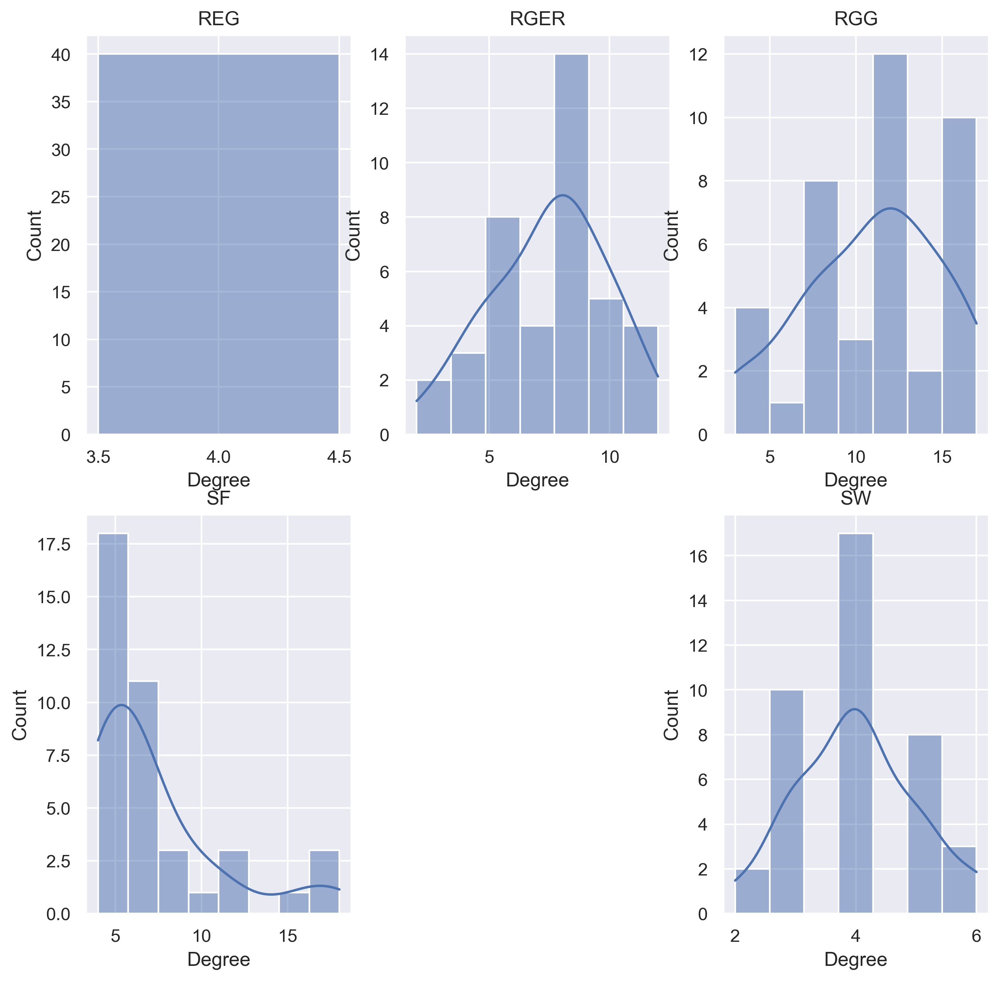

In [24]:
degrees_topologies = {}
for name, G in topologies.items():
    degrees_topologies[name] = find_degree(G)

values = lambda x: list(degrees_topologies[x].values())
plot_dist(values, 'Degree')

##### Γ1.2 Να υπολογιστεί ο μέσος βαθμός κόμβου καθώς και η διασπορά των βαθμών κόμβου για κάθε τοπολογία.

In [25]:
table = []
for name, G in topologies.items():
    mean = np.mean(list(degrees_topologies[name].values()))
    var = np.var(list(degrees_topologies[name].values()))

    table.append([name, mean, var])

headers = ['Topology', 'Mean degree value', 'Variance of degree value']
print(tabu(table, headers))

╒════════════╤═════════════════════╤════════════════════════════╕
│ Topology   │   Mean degree value │   Variance of degree value │
╞════════════╪═════════════════════╪════════════════════════════╡
│ REG        │                 4   │                       0    │
├────────────┼─────────────────────┼────────────────────────────┤
│ RGER       │                 7.5 │                       5.55 │
├────────────┼─────────────────────┼────────────────────────────┤
│ RGG        │                10.9 │                      15.64 │
├────────────┼─────────────────────┼────────────────────────────┤
│ SF         │                 7.2 │                      14.11 │
├────────────┼─────────────────────┼────────────────────────────┤
│ SW         │                 4   │                       0.95 │
╘════════════╧═════════════════════╧════════════════════════════╛


##### Να σχολιαστούν τα αποτελέσματα.

Με τον όρο κεντρικότητα γενικά εννοούμε ένα σύνολο από μετρικές που στοχεύουν στην ποσοτικοποίηση της "σημασίας" ή της "επιρροής" ενός κόμβου ή ενός συνόλου από κόμβους σε ένα δίκτυο. Εδώ θα ασχοληθούμε με την κεντρικότητα βαθμού. Καταρχάς, για τον REG παρατηρούμε πως έχει σταθερή κεντρικότητα βαθμού, αφού κάθε κόμβος έχει πάντα σταθερό αριθμό γειτόνων (4). Η διασπορά είναι λογικό να είναι 0 για τον REG, με βάση αυτά που έχουμε εξηγήσει και παραπάνω. Για τα RGER και RGG παρατηρούμε πως γενικά τα σχήματα μοιάζουν (με διαφορές προφανώς), και αυτό οφείλεται στο γεγονός πως σε αυτά η κεντρικότητα ακολουθεί την Uniform Distribution. Το RGG μας παρουσιάζει την μεγαλύτερη μέση κεντρικότητα βαθμού και σχετικά μεγάλη διασπορά, ενώ το RGER παρουσιάζει περίπου ίδια μέση κεντρικότητα με το SF, ενώ έχει μικρότερη διασπορά. Για τον SF, τώρα, παρατηρούμε πως η κατανομή της κεντρικότητας βαθμού ακολουθεί την Power Law Distribution, όπως και περιμέναμε με βάση την θεωρία, ενώ παρουσιάζει μεγάλη διασπορά. Τέλος, παρατηρούμε πως η κατανομή της κεντρικότητας βαθμού στον SW ακολουθεί, όπως παρουσιάζεται και στην θεωρία, την Heavy-Tailed κατανομή, ενώ με βάση τα δεδομένα μας παρατηρούμε πως έχει την ίδια μέση κεντρικότητα με τον REG και πολύ μικρή διασπορά.

### Γ2. Κεντρικότητα εγγύτητας (Closeness centrality)

##### Γ2.1 Να αναπαρασταθεί η κατατανομή της εγγύτητας κόμβων για κάθε τοπολογία.

In [26]:
def find_closeness(G):
    return nx.closeness_centrality(G)

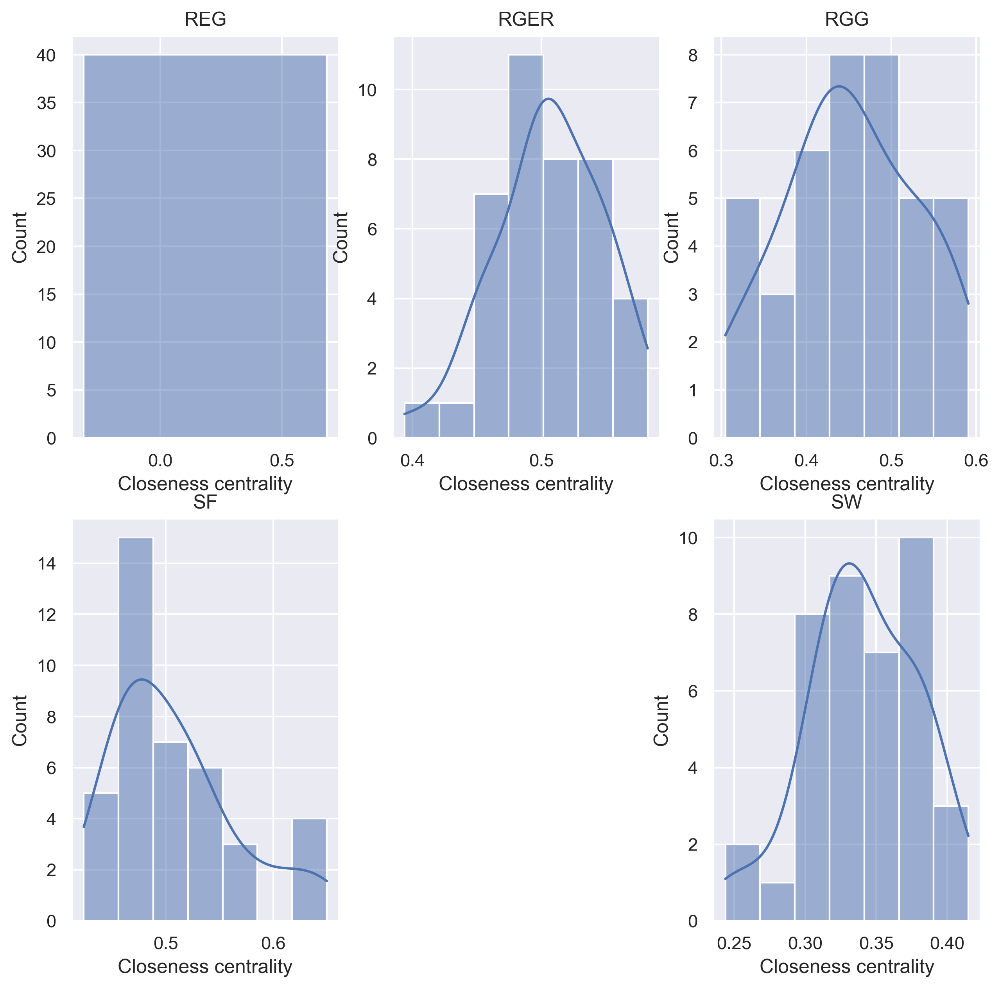

In [27]:
closeness_topologies = {}
for name, G in topologies.items():
    closeness_topologies[name] = find_closeness(G)

values = lambda x: list(closeness_topologies[x].values())
plot_dist(values, 'Closeness centrality')

##### Γ2.2 Να υπολογιστεί η μέση εγγύτητα καθώς και η διασπορά της για κάθε τοπολογία.

In [28]:
table = []
for name, G in topologies.items():
    mean = np.mean(list(closeness_topologies[name].values()))
    var = np.var(list(closeness_topologies[name].values()))

    table.append([name, mean, var])

headers = [
    'Topology', 'Mean Closeness Centrality', 'Variance of Closeness Centrality'
]
print(tabu(table, headers))

╒════════════╤═════════════════════════════╤════════════════════════════════════╕
│ Topology   │   Mean Closeness Centrality │   Variance of Closeness Centrality │
╞════════════╪═════════════════════════════╪════════════════════════════════════╡
│ REG        │                    0.185714 │                         0          │
├────────────┼─────────────────────────────┼────────────────────────────────────┤
│ RGER       │                    0.506045 │                         0.00167689 │
├────────────┼─────────────────────────────┼────────────────────────────────────┤
│ RGG        │                    0.45241  │                         0.00602486 │
├────────────┼─────────────────────────────┼────────────────────────────────────┤
│ SF         │                    0.508081 │                         0.00322873 │
├────────────┼─────────────────────────────┼────────────────────────────────────┤
│ SW         │                    0.340691 │                         0.00148243 │
╘════════════╧══

##### Να σχολιαστούν τα αποτελέσματα.

Για τον REG παρατηρούμε, όπως περιμέναμε, σταθερή μέση εγγύτητα, εφόσον όλοι οι κόμβοι έχουν βαθμό 4, η οποία μάλιστα είναι και η μικρότερη αναλογικά με τα υπόλοιπα μοντέλα, κάτι το οποίο ενδεχομένως να οφείλεται στην μορφολογία του REG, καθώς και μηδενική διασπορά. Στην συνέχεια, για τα RGER και RGG, παρατηρούμε ότι τα σχήματα μοιάζουν πάρα πολύ, και αυτό οφείλεται στο γεγονός πως η κεντρικότητα σε αυτά ακολουθεί την Uniform Distribution. Μάλιστα, στα δύο αυτά μοντέλα παρατηρούμε πως έχουν παρόμοια μέση κεντρικότητα εγγύτητας, ενώ η διασπορά τους είναι σχεδόν μηδενική. Αυτά μπορούν να εξηγηθούν ενδεχομένως και από την δημιουργία του giant component, μέσω του οποίου δημιουργούνται μικρότερα σύντομα μονοπάτια, με αποτέλεσμα οι κόμβοι να είναι πιο "κοντά" μεταξύ τους. Όπως και προηγουμένως, παρατηρούμε πως η κατανομή του SF μοιάζει με την κατανομή Power Law, καθώς επίσης παρατηρούμε πως έχει μεγάλη μέση κεντρικότητα εγγύτητας, το οποίο πιθανώς οφείλεται στο ότι τα hubs που δημιουργούνται βοηθούν στην μείωση του μέσου μήκους μονοπατιού και οδηγούν και στην αύξηση της κεντρικότητας λόγω βαθμού, καθώς αποτελούν κόμβους μεγάλου βαθμού. Όπως και στα άλλα μοντέλα η διασπορά είναι σχεδόν μηδενική. Τέλος, για το SW παρατηρούμε, όπως και πριν, πως ακολουθεί την κατανομή Heavy-Tailed, ενώ με βάση τα δεδομένα μας παρουσιάζει γενικά μικρότερη μέση κεντρικότητα εγγύτητας από τα RGER, RGG και SF.

### Γ3. Ενδιαμεσική κεντρικότητα (Betweenness centrality)

##### Γ3.1 Να αναπαρασταθεί η κατατανομή της ενδιαμεσικής κεντρικότητας κόμβων για κάθε τοπολογία.

In [29]:
def find_betweenness(G):
    return nx.betweenness_centrality(G)

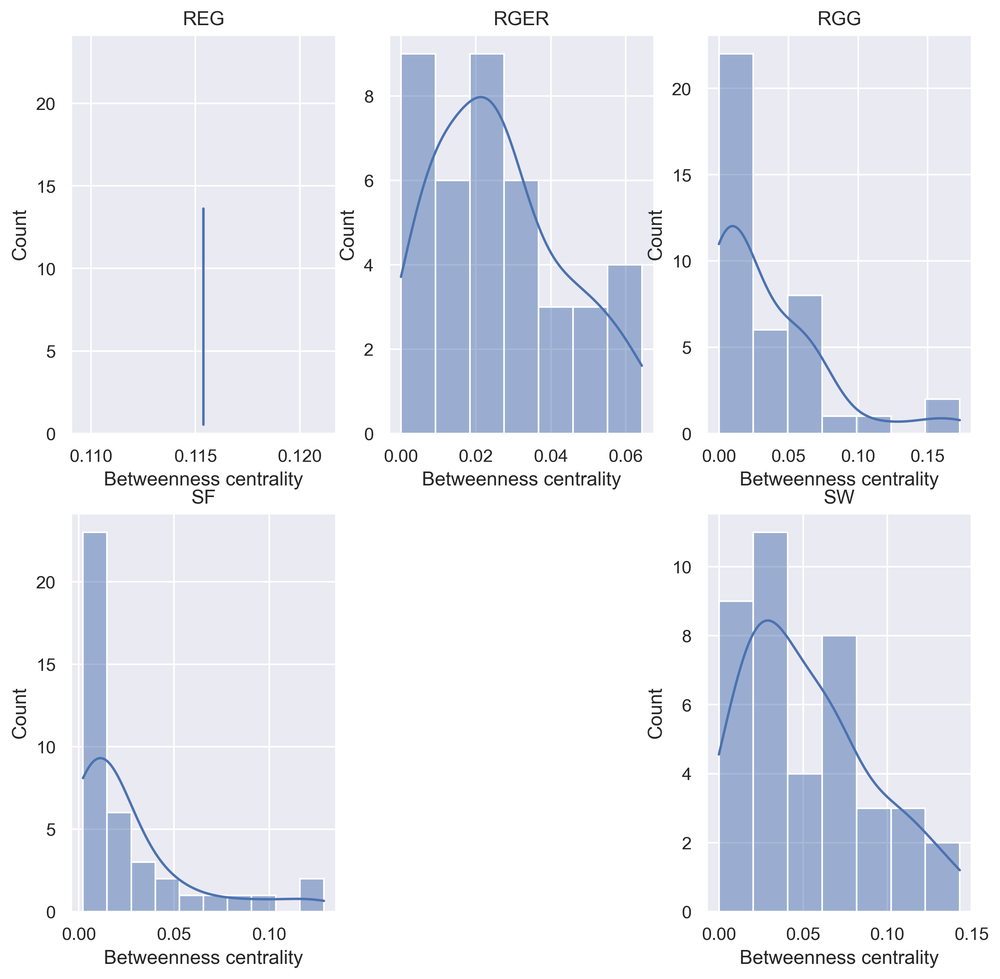

In [30]:
betweenness_topologies = {}
for name, G in topologies.items():
    betweenness_topologies[name] = find_betweenness(G)

values = lambda x: list(betweenness_topologies[x].values())
plot_dist(values, 'Betweenness centrality')

##### Γ3.2 Να υπολογιστεί η μέση ενδιαμεσική κεντρικότητα καθώς και η διασπορά της για κάθε τοπολογία.

In [31]:
table = []
for name, G in topologies.items():
    mean = np.mean(list(betweenness_topologies[name].values()))
    var = np.var(list(betweenness_topologies[name].values()))

    table.append([name, mean, var])

headers = [
    'Topology', 'Mean Betweenness Centrality',
    'Variance of Betweenness Centrality'
]
print(tabu(table, headers))

╒════════════╤═══════════════════════════════╤══════════════════════════════════════╕
│ Topology   │   Mean Betweenness Centrality │   Variance of Betweenness Centrality │
╞════════════╪═══════════════════════════════╪══════════════════════════════════════╡
│ REG        │                     0.115385  │                          9.62965e-35 │
├────────────┼───────────────────────────────┼──────────────────────────────────────┤
│ RGER       │                     0.0260459 │                          0.000284947 │
├────────────┼───────────────────────────────┼──────────────────────────────────────┤
│ RGG        │                     0.0337045 │                          0.00163783  │
├────────────┼───────────────────────────────┼──────────────────────────────────────┤
│ SF         │                     0.0260796 │                          0.000983865 │
├────────────┼───────────────────────────────┼──────────────────────────────────────┤
│ SW         │                     0.0519906 │        

##### Να σχολιαστούν τα αποτελέσματα.

Τώρα θα ασχοληθούμε με την ενδιάμεση κεντρικότητα. Όπως είναι αναμενόμενο, ο REG έχει σταθερή ενδιάμεση κεντρικότητα, ενώ έχει και την μέγιστη μέση ενδιάμεση κεντρικότητα, κάτι το οποίο αιτιολογείται από την μορφολογία του, εφόσον όλοι οι κόμβοι έχουν σταθερά 4 γείτονες και όλοι οι κόμβοι είναι εξίσου σημαντικοί εφόσον αποτελούν μέρος των συντομότερων μονοπατιών μεταξύ των άλλων κόμβων. Η διασπορά είναι μηδενική. Όσον αφορά τώρα στα RGER και RGG, παρατηρούμε πως έχουν παρόμοιο distribution (uniform) ενώ έχουν πολύ παραπλήσια μέση ενδιάμεση κεντρικότητα και μικρή διασπορά. Για το SF παρατηρούμε πως ακολουθεί την κατανομή Power Law, δηλαδή ότι έχει πολλούς κόμβους με μικρή ενδιάμεση κεντρικότητα και ελάχιστους με μεγάλη, οδηγώντας έτσι στο να έχει την μικρότερη ενδιάμεση κεντρικότητα από τα μοντέλα που εξετάζουμε, κάτι το οποίο είναι λογικό εφόσον ελάχιστοι κόμβοι, τα hubs, εμφανίζονται στα περισσότερα ελάχιστα μονοπάτια ενώ η πλειονότητα των κόμβων δεν βρίσκεται στα ελάχιστα μονοπάτια μεταξύ των υπόλοιπων κόμβων. Τέλος το SW έχει την δεύτερη μεγαλύτερη μέση ενδιάμεση κεντρικότητα μετά το REG, ενώ παρατηρούμε πάλι πως ακολουθεί την Heavy-Tailed Distribution.

### Γ4. Kεντρικότητα Katz

##### Γ4.1 Να αναπαρασταθεί η κατανομή της κεντρικότητας Katz των κόμβων για κάθε τοπολογία. 
Για τον προσδιορισμό της παραμέτρου $alpha$ της συνάρτησης katz_centrality,  να υπολογιστεί η μεγαλύτερη ιδιοτιμή $λ_{max}$ του πίνακα γειτνίασης με τη συνάρτηση adjacency_spectrum του networkx. 
H $alpha$ ορίζεται να είναι ιση με $\frac{1}{λ_{max}}-0.01$.


In [32]:
def find_katz(G):
    lambda_max = nx.adjacency_spectrum(G).max()
    alpha = np.real(1 / lambda_max - 0.01)
    return nx.katz_centrality(G, alpha)

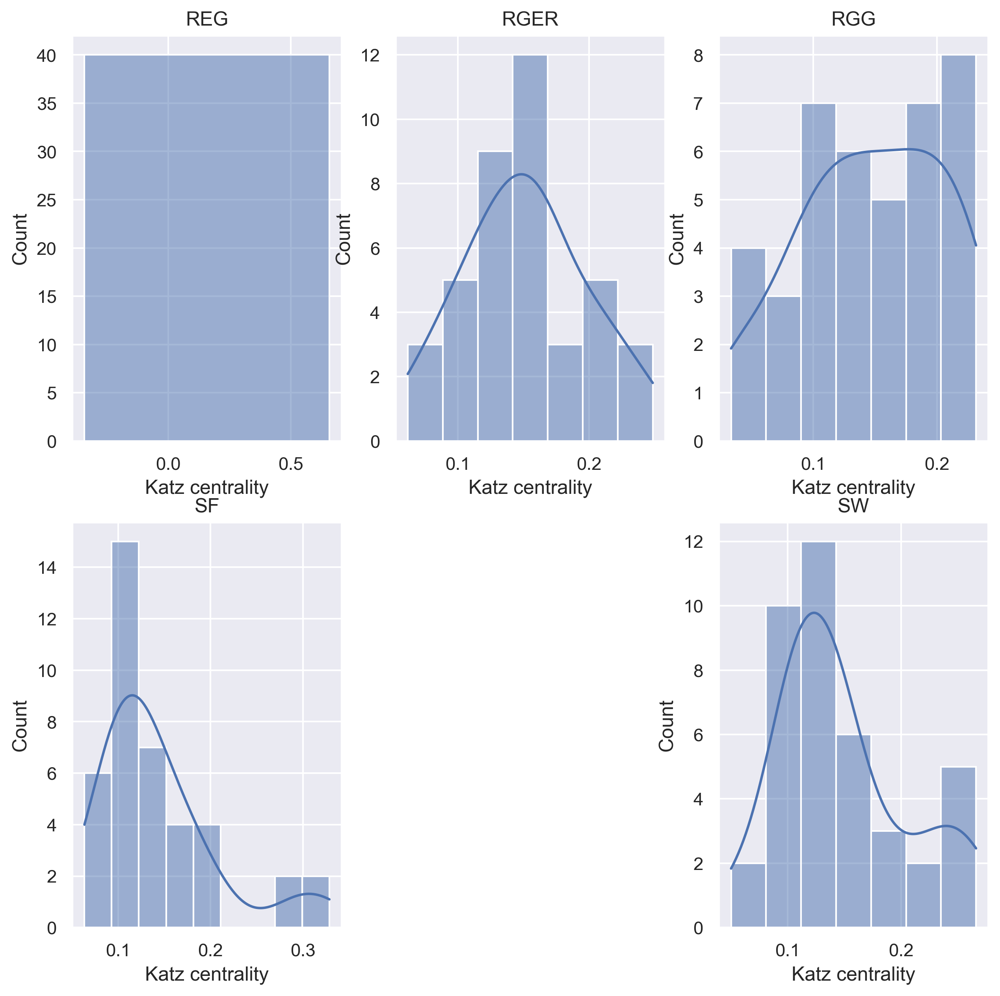

In [33]:
katz_topologies = {}
for name, G in topologies.items():
    katz_topologies[name] = find_katz(G)

values = lambda x: list(katz_topologies[x].values())
plot_dist(values, 'Katz centrality')

##### Γ4.2 Να υπολογιστεί η μέση  κεντρικότητα Katz  καθώς και η διασπορά της για κάθε τοπολογία.

In [34]:
table = []
for name, G in topologies.items():
    mean = np.mean(list(katz_topologies[name].values()))
    var = np.var(list(katz_topologies[name].values()))

    table.append([name, mean, var])

headers = ['Topology', 'Mean Katz Centrality', 'Variance of Katz Centrality']
print(tabu(table, headers))

╒════════════╤════════════════════════╤═══════════════════════════════╕
│ Topology   │   Mean Katz Centrality │   Variance of Katz Centrality │
╞════════════╪════════════════════════╪═══════════════════════════════╡
│ REG        │               0.158114 │                    0          │
├────────────┼────────────────────────┼───────────────────────────────┤
│ RGER       │               0.151146 │                    0.00215496 │
├────────────┼────────────────────────┼───────────────────────────────┤
│ RGG        │               0.147198 │                    0.00333285 │
├────────────┼────────────────────────┼───────────────────────────────┤
│ SF         │               0.144561 │                    0.00410217 │
├────────────┼────────────────────────┼───────────────────────────────┤
│ SW         │               0.147785 │                    0.00315956 │
╘════════════╧════════════════════════╧═══════════════════════════════╛


##### Να σχολιαστούν τα αποτελέσματα.

Ως προς την κεντρικότητα Katz, όπως είναι αναμενόμενο, ο REG εμφανίζει σταθερή κεντρικότητα Katz, λόγω της μορφολογίας του. Γενικότερα, αυτό που μπορεί εύκολα να παρατηρηθεί είναι πως όλα τα μοντέλα έχουν ουσιαστικά παραπλήσιες μέσες κεντρικότες καθώς και διασπορές, εκτός του REG που έχει διασπορά 0. Επίσης, μπορεί να παρατηρηθεί πως τα μοντέλα RGER και RGG έχουν παρόμοια κατανομή, που είναι λογικό δεδομένου ότι η κεντρικότητα σε αυτά ακολουθά την κατανομή Uniform, η κατανομή στο SF ακολουθά όπως είναι γνωστό την κατανομή Power Law και η κατανομή στο SW όπως και πριν ακολουθά την κατανομή Heavy-Tailed.

#### Να προσδιοριστούν, για κάθε τοπολογία, οι πιο κεντρικοί κόμβοι ως προς το βαθμό, την εγγύτητα, την ενδιαμεσική κεντρικότητα και την κεντρικότητα Katz.

In [35]:
def find_central(G):
    degree = [{
        'Node': name,
        'Degree': centrallity
    } for name, centrallity in find_degree(G).items()]

    closeness = [{
        'Node': name,
        'Closeness': centrallity
    } for name, centrallity in find_closeness(G).items()]

    betweenness = [{
        'Node': name,
        'Betweenness': centrallity
    } for name, centrallity in find_betweenness(G).items()]

    katz = [{
        'Node': name,
        'Katz': centrallity
    } for name, centrallity in find_katz(G).items()]

    degree = pd.DataFrame(degree)
    closeness = pd.DataFrame(closeness)
    betweenness = pd.DataFrame(betweenness)
    katz = pd.DataFrame(katz)

    dfs = [degree, closeness, betweenness, katz]
    df_final = reduce(lambda left, right: pd.merge(left, right, on='Node'), dfs)

    return df_final

In [36]:
top_nodes_count = 10
get_n_largest = lambda x: centrality.nlargest(top_nodes_count, x)[['Node', x]]
for name, G in topologies.items():
    centrality = find_central(G)
    display(Markdown('**' + name + ':**'))
    side_by_side([
        get_n_largest('Degree'),
        get_n_largest('Closeness'),
        get_n_largest('Betweenness'),
        get_n_largest('Katz')
    ], ["By Degree", 'By Closeness', 'By Betweenness', 'By Katz'])

**REG:**

By Degree By Closeness By Betweenness By Katz 
 
 
 Node 
 Degree 
 
 
 
 
 0 
 4 
 
 
 1 
 4 
 
 
 2 
 4 
 
 
 3 
 4 
 
 
 4 
 4 
 
 
 5 
 4 
 
 
 6 
 4 
 
 
 7 
 4 
 
 
 8 
 4 
 
 
 9 
 4 
 
 
 
 
 
 Node 
 Closeness 
 
 
 
 
 0 
 0.185714 
 
 
 1 
 0.185714 
 
 
 2 
 0.185714 
 
 
 3 
 0.185714 
 
 
 4 
 0.185714 
 
 
 5 
 0.185714 
 
 
 6 
 0.185714 
 
 
 7 
 0.185714 
 
 
 8 
 0.185714 
 
 
 9 
 0.185714 
 
 
 
 
 
 Node 
 Betweenness 
 
 
 
 
 11 
 0.115385 
 
 
 0 
 0.115385 
 
 
 1 
 0.115385 
 
 
 2 
 0.115385 
 
 
 3 
 0.115385 
 
 
 4 
 0.115385 
 
 
 8 
 0.115385 
 
 
 9 
 0.115385 
 
 
 12 
 0.115385 
 
 
 13 
 0.115385 
 
 
 
 
 
 Node 
 Katz 
 
 
 
 
 0 
 0.158114 
 
 
 1 
 0.158114 
 
 
 2 
 0.158114 
 
 
 3 
 0.158114 
 
 
 4 
 0.158114 
 
 
 5 
 0.158114 
 
 
 6 
 0.158114 
 
 
 7 
 0.158114 
 
 
 8 
 0.158114 
 
 
 9 
 0.158114

**RGER:**

By Degree By Closeness By Betweenness By Katz 
 
 
 Node 
 Degree 
 
 
 
 
 7 
 12 
 
 
 1 
 11 
 
 
 23 
 11 
 
 
 27 
 11 
 
 
 10 
 10 
 
 
 25 
 10 
 
 
 32 
 10 
 
 
 38 
 10 
 
 
 39 
 10 
 
 
 4 
 9 
 
 
 
 
 
 Node 
 Closeness 
 
 
 
 
 27 
 0.582090 
 
 
 1 
 0.573529 
 
 
 23 
 0.565217 
 
 
 39 
 0.565217 
 
 
 7 
 0.549296 
 
 
 32 
 0.549296 
 
 
 37 
 0.549296 
 
 
 38 
 0.549296 
 
 
 4 
 0.541667 
 
 
 10 
 0.541667 
 
 
 
 
 
 Node 
 Betweenness 
 
 
 
 
 27 
 0.064323 
 
 
 38 
 0.058975 
 
 
 7 
 0.057900 
 
 
 23 
 0.055325 
 
 
 36 
 0.050192 
 
 
 39 
 0.046545 
 
 
 4 
 0.046295 
 
 
 1 
 0.044930 
 
 
 10 
 0.040371 
 
 
 11 
 0.040267 
 
 
 
 
 
 Node 
 Katz 
 
 
 
 
 1 
 0.248538 
 
 
 7 
 0.241486 
 
 
 32 
 0.230036 
 
 
 27 
 0.221684 
 
 
 25 
 0.207810 
 
 
 10 
 0.205242 
 
 
 23 
 0.202353 
 
 
 39 
 0.200828 
 
 
 38 
 0.191385 
 
 
 37 
 0.189766

**RGG:**

By Degree By Closeness By Betweenness By Katz 
 
 
 Node 
 Degree 
 
 
 
 
 9 
 17 
 
 
 15 
 17 
 
 
 20 
 17 
 
 
 6 
 16 
 
 
 26 
 16 
 
 
 4 
 15 
 
 
 12 
 15 
 
 
 13 
 15 
 
 
 16 
 15 
 
 
 21 
 15 
 
 
 
 
 
 Node 
 Closeness 
 
 
 
 
 15 
 0.590909 
 
 
 4 
 0.573529 
 
 
 12 
 0.573529 
 
 
 16 
 0.573529 
 
 
 21 
 0.565217 
 
 
 31 
 0.549296 
 
 
 35 
 0.541667 
 
 
 6 
 0.534247 
 
 
 9 
 0.527027 
 
 
 20 
 0.527027 
 
 
 
 
 
 Node 
 Betweenness 
 
 
 
 
 15 
 0.173153 
 
 
 21 
 0.150904 
 
 
 28 
 0.112405 
 
 
 20 
 0.074514 
 
 
 16 
 0.068928 
 
 
 9 
 0.066192 
 
 
 35 
 0.066010 
 
 
 6 
 0.062237 
 
 
 4 
 0.061824 
 
 
 12 
 0.061824 
 
 
 
 
 
 Node 
 Katz 
 
 
 
 
 15 
 0.231705 
 
 
 4 
 0.230357 
 
 
 12 
 0.230357 
 
 
 16 
 0.228628 
 
 
 20 
 0.221981 
 
 
 6 
 0.218490 
 
 
 9 
 0.217145 
 
 
 21 
 0.206633 
 
 
 13 
 0.200988 
 
 
 24 
 0.196274

**SF:**

By Degree By Closeness By Betweenness By Katz 
 
 
 Node 
 Degree 
 
 
 
 
 6 
 18 
 
 
 0 
 17 
 
 
 8 
 17 
 
 
 7 
 15 
 
 
 5 
 11 
 
 
 13 
 11 
 
 
 15 
 11 
 
 
 20 
 10 
 
 
 12 
 9 
 
 
 1 
 8 
 
 
 
 
 
 Node 
 Closeness 
 
 
 
 
 6 
 0.650000 
 
 
 0 
 0.639344 
 
 
 8 
 0.629032 
 
 
 7 
 0.619048 
 
 
 13 
 0.582090 
 
 
 15 
 0.582090 
 
 
 5 
 0.573529 
 
 
 10 
 0.541667 
 
 
 11 
 0.534247 
 
 
 12 
 0.534247 
 
 
 
 
 
 Node 
 Betweenness 
 
 
 
 
 8 
 0.128727 
 
 
 6 
 0.118992 
 
 
 0 
 0.099483 
 
 
 7 
 0.083385 
 
 
 15 
 0.066887 
 
 
 13 
 0.053961 
 
 
 20 
 0.045507 
 
 
 5 
 0.043864 
 
 
 1 
 0.037417 
 
 
 29 
 0.031184 
 
 
 
 
 
 Node 
 Katz 
 
 
 
 
 6 
 0.328710 
 
 
 0 
 0.317483 
 
 
 8 
 0.296806 
 
 
 7 
 0.284689 
 
 
 5 
 0.209349 
 
 
 13 
 0.195647 
 
 
 2 
 0.189528 
 
 
 15 
 0.183104 
 
 
 12 
 0.178721 
 
 
 10 
 0.170904

**SW:**

By Degree By Closeness By Betweenness By Katz 
 
 
 Node 
 Degree 
 
 
 
 
 0 
 6 
 
 
 8 
 6 
 
 
 17 
 6 
 
 
 1 
 5 
 
 
 2 
 5 
 
 
 4 
 5 
 
 
 5 
 5 
 
 
 12 
 5 
 
 
 23 
 5 
 
 
 34 
 5 
 
 
 
 
 
 Node 
 Closeness 
 
 
 
 
 0 
 0.414894 
 
 
 17 
 0.406250 
 
 
 32 
 0.397959 
 
 
 23 
 0.386139 
 
 
 34 
 0.386139 
 
 
 2 
 0.382353 
 
 
 24 
 0.382353 
 
 
 25 
 0.382353 
 
 
 13 
 0.378641 
 
 
 1 
 0.375000 
 
 
 
 
 
 Node 
 Betweenness 
 
 
 
 
 0 
 0.143064 
 
 
 25 
 0.129585 
 
 
 8 
 0.121688 
 
 
 23 
 0.109163 
 
 
 17 
 0.102639 
 
 
 32 
 0.102019 
 
 
 2 
 0.101918 
 
 
 34 
 0.089563 
 
 
 1 
 0.072516 
 
 
 13 
 0.071824 
 
 
 
 
 
 Node 
 Katz 
 
 
 
 
 4 
 0.266349 
 
 
 2 
 0.261896 
 
 
 0 
 0.255190 
 
 
 1 
 0.252695 
 
 
 5 
 0.238303 
 
 
 3 
 0.233885 
 
 
 8 
 0.230952 
 
 
 39 
 0.203278 
 
 
 6 
 0.200359 
 
 
 17 
 0.186170

In [37]:
def get_central_nodes(G, func):
    centrality = func(G)
    max_key = max(centrality, key=centrality.get)
    max_value = centrality[max_key]
    max_key = [
        str(k) for k, v in centrality.items() if abs(v - max_value) <= 0.000000001
    ]
    return (", ".join(max_key))

table = []

for name, G in topologies.items():
    table.append([
        name,
        textwrap.fill((get_central_nodes(G, find_degree)), 25),
        textwrap.fill((get_central_nodes(G, find_closeness )), 25),
        textwrap.fill((get_central_nodes(G, find_betweenness )), 25),
        textwrap.fill((get_central_nodes(G, find_katz )), 25)
    ])
headers = ['Topology', 'By Degree', 'By Closeness', 'By Betweenness', 'By Katz']
print(tabu(table, headers))

╒════════════╤═══════════════════════════╤═══════════════════════════╤═══════════════════════════╤═══════════════════════════╕
│ Topology   │ By Degree                 │ By Closeness              │ By Betweenness            │ By Katz                   │
╞════════════╪═══════════════════════════╪═══════════════════════════╪═══════════════════════════╪═══════════════════════════╡
│ REG        │ 0, 1, 2, 3, 4, 5, 6, 7,   │ 0, 1, 2, 3, 4, 5, 6, 7,   │ 0, 1, 2, 3, 4, 5, 6, 7,   │ 0, 1, 2, 3, 4, 5, 6, 7,   │
│            │ 8, 9, 10, 11, 12, 13, 14, │ 8, 9, 10, 11, 12, 13, 14, │ 8, 9, 10, 11, 12, 13, 14, │ 8, 9, 10, 11, 12, 13, 14, │
│            │ 15, 16, 17, 18, 19, 20,   │ 15, 16, 17, 18, 19, 20,   │ 15, 16, 17, 18, 19, 20,   │ 15, 16, 17, 18, 19, 20,   │
│            │ 21, 22, 23, 24, 25, 26,   │ 21, 22, 23, 24, 25, 26,   │ 21, 22, 23, 24, 25, 26,   │ 21, 22, 23, 24, 25, 26,   │
│            │ 27, 28, 29, 30, 31, 32,   │ 27, 28, 29, 30, 31, 32,   │ 27, 28, 29, 30, 31, 32,   │ 27, 28, 29, 

##### Να σχολιαστούν τα αποτελέσματα.

Για αυτήν την άσκηση ταξινομούμε τους κόμβους με βάση τις μετρικές που μας δόθηκαν ώστε να μπορούμε να βρούμε τους πιο κεντρικούς κόμβους ενώ τυπώνουμε τους πιο κεντρικούς κόμβους για καλύτερη κατανόηση. Στις περισσότερες περιπτώσεις, όπως παρατηρούμε και παραπάνω, ο πιο κεντρικός κόμβος ως προς μια μετρική σε κάθε τοπολογία είναι ένας, πέρα από τις περιπτώσεις SW και RGG στην κεντρικότητα βαθμού. Προφανώς, από αυτήν την παρατήρηση εξαιρούνται οι πιο κεντρικοί κόμβοι στο REG ως προς τις μετρικές, όπου παρατηρούμε ότι κάθε φορά οι "πιο κεντρικοί κόμβοι" είναι όλοι, πράγμα που όπως έχει εξηγηθεί και παραπάνω οφείλεται στο γεγονός πως κάθε κόμβος στο REG έχει 4 γείτονες, και στην γενικότερη μορφολογία του πλέγματος.

### Γ5. Αλγόριθμος PageRank σε πραγματικό δίκτυο

**Να εκτελεστεί ο αλγόριθμος pagerank στην τεσσαρακοστή (40η) μεγαλύτερη συνδεδεμένη συνιστώσα του κατευθυνόμενου δίκτυου web-Stanford του οποίου οι ακμές δίνονται στο αρχείο web-Standord.txt.**

**Για να υπολογίσετε τις συνδεδεμένες συνιστώσες, χρησιμοποιήστε τη συνάρτηση weakly_connected_components του networkx.
Περισσότερες πληροφορίες για το dataset δίνονται στο link https://snap.stanford.edu/data/web-Stanford.html.**

In [38]:
G_web = nx.read_edgelist("web-Stanford.txt", create_using=nx.DiGraph())

In [39]:
# find the 40th largest weakly connected component of the graph web-Stanford
G40 = [
    c for c in sorted(
        nx.weakly_connected_components(G_web), key=len, reverse=True)
][40]
G40 = G_web.subgraph(G40)

Text(0.5, 1.0, 'Pagerank Distribution')

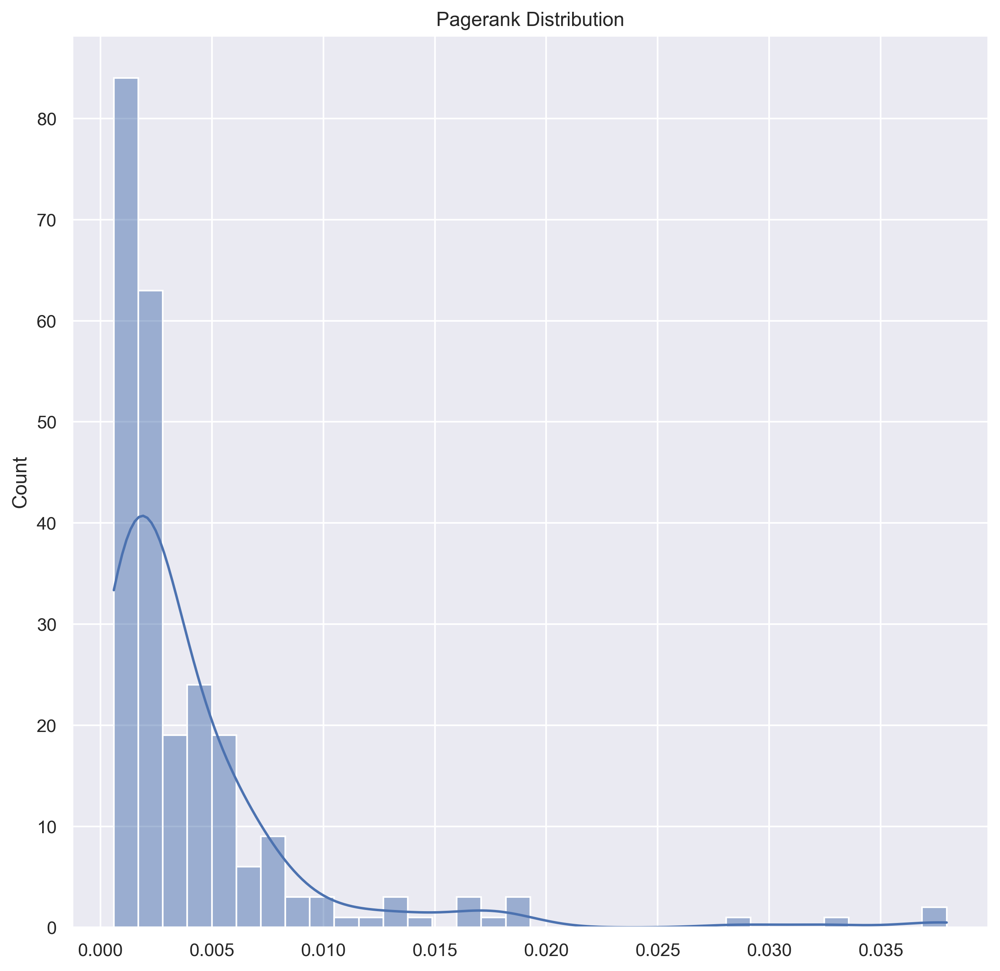

In [40]:
#pagerank
pagerank = nx.pagerank(G40)

sns.histplot(list(pagerank.values()),
             kde=True).set_title('Pagerank Distribution')

In [41]:
pagerank_lst = [(k, v) for k, v in {k: v for k, v in pagerank.items()}.items()]
pagerank_lst.sort(key=lambda tup: tup[1], reverse=True)


def pairwise(iterable):
    a = iter(iterable)
    return zip(a, a, a)


print("Results of pagerank algorithm:")
cnt = 1
for x, y, z in pairwise(pagerank_lst):
    print('|{:3d}) {:8}: {:.10f} | {:3d}) {:8}:{:.10f} | {:3d}) {:8}:{:.10f}|'.
          format(cnt, *x, cnt + 1, *y, cnt + 2, *z))
    cnt += 3

Results of pagerank algorithm:
|  1) 17409   : 0.0379530354 |   2) 129542  :0.0373378613 |   3) 247330  :0.0324724970|
|  4) 43279   : 0.0286366598 |   5) 13245   :0.0183995923 |   6) 104303  :0.0183664136|
|  7) 120276  : 0.0183073802 |   8) 172962  :0.0173225821 |   9) 175016  :0.0166654484|
| 10) 221104  : 0.0166485996 |  11) 13896   :0.0164020754 |  12) 144371  :0.0138259592|
| 13) 257142  : 0.0136698517 |  14) 235902  :0.0133995877 |  15) 52124   :0.0130474768|
| 16) 152364  : 0.0118173136 |  17) 4786    :0.0109180110 |  18) 75667   :0.0102675033|
| 19) 66332   : 0.0100983532 |  20) 263063  :0.0100628432 |  21) 229546  :0.0086796553|
| 22) 216882  : 0.0084842353 |  23) 72179   :0.0084224630 |  24) 225770  :0.0078856791|
| 25) 25495   : 0.0078763687 |  26) 73993   :0.0078011339 |  27) 252376  :0.0075104631|
| 28) 52151   : 0.0074531609 |  29) 171794  :0.0074153215 |  30) 96490   :0.0072929603|
| 31) 10267   : 0.0072923300 |  32) 7015    :0.0072526671 |  33) 29108   :0.0071491291|
|

##### Να σχολιαστούν τα αποτελέσματα.

**Για την επιλογή του γράφου έγινε χρήση του index 40 καθότι δόθηκε διευκρίνηση στις απορίες εργαστηρίου στο helios.** Παραπάνω φαίνονται η κατανομή του αποτελέσματος του αλγορίθμου του Pagerank και η οι κόμβοι της συνδεδεμένης συνιστώσας ταξινομημένοι με βάση το pagerank. Παρατηρούμε πως η κατανομή ακολουθεί την Power Law, δηλαδή η πλειοψηφία των κόμβων έχει μικρή "σημαντικότητα", ενώ είναι λίγοι αυτοί οι κόμβοι οι οποίοι έχουν μεγάλη, κάτι το οποίο μοιάζει με την ιδιότητα που έχουν και τα Scale-Free δίκτυα, εφόσον και σε αυτά οι κατανομές ακολουθούν την Power Law Distribution. Αυτό είναι κάτι αναμενόμενο, εφόσον οι πιο σημαντικοί ή κεντρικοί κόμβοι είναι αυτοί που είναι πιο πιθανό να έχουν συνδέσεις με άλλους κόμβους, ενώ αυτοί που δεν είναι τόσο "σημαντικοί" δεν έχουν τόσες συνδέσεις με άλλους. Έτσι ακριβώς συμβαίνει και με τις ιστοσελίδες στο διαδίκτυο, εφόσον οι πιο σημαντικές ιστοσελίδες είναι αυτές που είναι πιο πιθανό να δεχθούν links από άλλες ιστοσελίδες, δηλαδή οι περισσότερες σελίδες (κόμβοι) δείχνουν σε λίγες σημαντικές.

### Δ) Μελέτη συνεκτικότητας και ευρωστία (robustness) δικτύων 

### Δ1. Μελέτη συνεκτικότητας

### Δ1. Μελέτη συνεκτικότητας
Για κάθε τύπο σύνθετου δικτύου, ορίζεται το ποσοστό συνεκτικότητας για έναν αριθμό παραγόμενων τοπολογιών, ως κλάσμα των συνδεδεμένων τοπολογιών σε σχέση με τον αριθμό όλων των παραγόμενων τοπολογιών.

Με βάση τις τιμές παραμέτρων του Πίνακα 2, μελετήστε τη συνεκτικότητα κάθε τύπου σύνθετου δικτύου του Πίνακα 1.

<table>
    <thead>
        <tr>
            <th>Τοπολογία</th>
            <th>Εύρος Παραμέτρων</th>
        </tr>
    </thead>
    <tbody>
        <tr>
            <td >REG</td>
            <td rowspan=6>$n = \{100, 200\}$</td>
            <td>$d \in [2,10]$ με βήμα $2$</td>
        </tr>
        <tr>
            <td>RGER</td>
            <td>$M \in [100,800]$ με βήμα $100$</td>
        </tr>
        <tr>
            <td>RG-Gilbert</td>
            <td>$p \in [0.01,0.1]$ με βήμα $0.01$</td>
        </tr>
        <tr>
            <td>RGG</td>
            <td>$R \in [0.025,0.25]$ με βήμα $0.025$</td>
        </tr>
        <tr>
            <td>SF</td>
            <td>$d \in [2,10]$ με βήμα $2$</td>
        </tr>
        <tr>
            <td>SW</td>
            <td>$d \in [2,10]$ με βήμα $2$ και $g_p \in [0.1,0.7]$ με βήμα $0.1$</td>
        </tr>
    </tbody>
    <caption>Πίνακας 2</caption>
</table>

#### Δ1.1 Για κάθε έναν τύπο δικτύου, να παράξετε 100 διαφορετικές τοπολογίες και να παρουσιάσετε το διάγραμμα ποσοστού συνεκτικότητας σε σχέση με τις καθορισμένες παραμέτρους κάθε δικτύου.

In [42]:
def connected_percentage(n, args, fn):
    connected_count = 0
    for _ in range(0, 100):
        tmp_G = fn(**args)
        connected_count += 1 if nx.is_connected(tmp_G) else 0
    return (connected_count / 100)

##### Connectivity REG

In [43]:
conn_reg = pd.DataFrame()
for n, d in itertools.product([100, 200], range(2, 11, 2)):
    perc = connected_percentage(n, {
        'n': n,
        'k': d,
        'p': 0
    }, nx.watts_strogatz_graph)
    reg_dict = {'n': n, 'd': d, 'Percentage': perc}
    conn_reg = conn_reg.append(reg_dict, ignore_index=True)

##### Connectivity RG Erdos-Renyi

In [44]:
conn_rger = pd.DataFrame()
for n, M in itertools.product([100, 200], range(100, 900, 100)):
    perc = connected_percentage(n, {'n': n, 'm': M}, nx.gnm_random_graph)

    reg_dict = {'n': n, 'M': M, 'Percentage': perc}
    conn_rger = conn_rger.append(reg_dict, ignore_index=True)

##### Connectivity RG Gilbert

In [45]:
conn_rg_g = pd.DataFrame()
for n, p in itertools.product([100, 200], np.arange(0.01, 0.11, 0.01)):
    perc = connected_percentage(n, {'n': n, 'p': p}, nx.gnp_random_graph)

    reg_dict = {'n': n, 'p': p, 'Percentage': perc}
    conn_rg_g = conn_rg_g.append(reg_dict, ignore_index=True)

##### Connectivity RGG

In [46]:
conn_rgg = pd.DataFrame()
for n, R in itertools.product([100, 200], np.arange(0.025, 0.275, 0.025)):
    perc = connected_percentage(n, {
        'n': n,
        'radius': R
    }, nx.random_geometric_graph)

    reg_dict = {'n': n, 'R': R, 'Percentage': perc}
    conn_rgg = conn_rgg.append(reg_dict, ignore_index=True)

##### Connectivity SF

In [47]:
conn_sf = pd.DataFrame()
for n, m in itertools.product([100, 200], range(2, 11, 2)):
    perc = connected_percentage(n, {'n': n, 'm': m}, nx.barabasi_albert_graph)

    reg_dict = {'n': n, 'd': m, 'Percentage': perc}
    conn_sf = conn_sf.append(reg_dict, ignore_index=True)

##### Connectivity SW

In [48]:
conn_sw = pd.DataFrame()
for n, d, gp in itertools.product([100, 200], range(2, 11, 2),
                                  np.arange(0.1, 0.8, 0.1)):
    perc = connected_percentage(n, {
        'n': n,
        'k': d,
        'p': gp
    }, nx.watts_strogatz_graph)
    reg_dict = {'n': n, 'd': d, 'gp': gp, 'Percentage': perc}
    conn_sw = conn_sw.append(reg_dict, ignore_index=True)
pd.set_option('display.max_rows', None)

##### Diagrams

[]

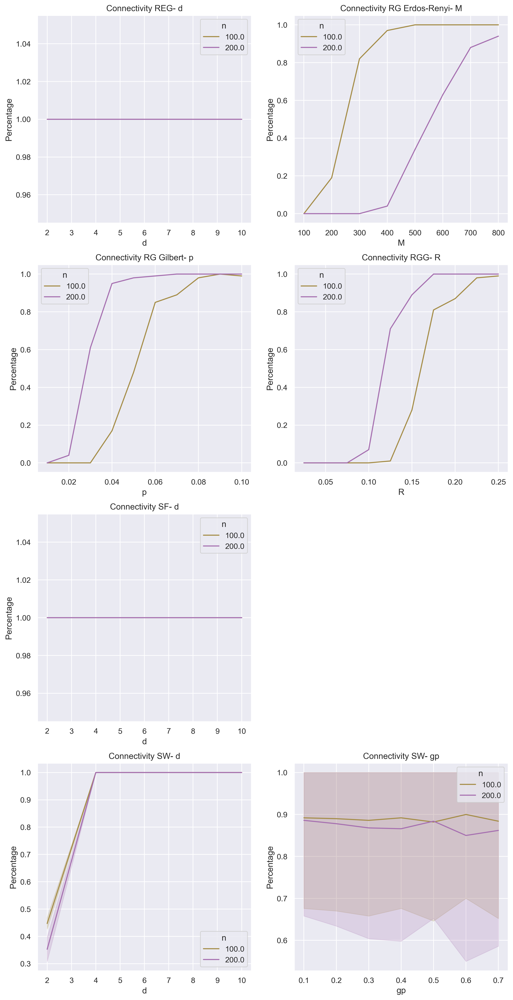

In [49]:
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(12, 25))

# REG
sns.lineplot(data=pd.DataFrame(conn_reg),
             x='d',
             y='Percentage',
             hue='n',
             palette=["#a58d48", "#a670b0"],
             ax=axs[0][0]).set_title('Connectivity REG- d')

# RG Erdos-Renyi
sns.lineplot(data=pd.DataFrame(conn_rger),
             x='M',
             y='Percentage',
             hue='n',
             palette=["#a58d48", "#a670b0"],
             ax=axs[0][1]).set_title('Connectivity RG Erdos-Renyi- M')

# RG Gilbert
sns.lineplot(data=pd.DataFrame(conn_rg_g),
             x='p',
             y='Percentage',
             hue='n',
             palette=["#a58d48", "#a670b0"],
             ax=axs[1][0]).set_title('Connectivity RG Gilbert- p')

# RGG
sns.lineplot(data=pd.DataFrame(conn_rgg),
             x='R',
             y='Percentage',
             hue='n',
             palette=["#a58d48", "#a670b0"],
             ax=axs[1][1]).set_title('Connectivity RGG- R')

# SF
sns.lineplot(data=pd.DataFrame(conn_sf),
             x='d',
             y='Percentage',
             hue='n',
             palette=["#a58d48", "#a670b0"],
             ax=axs[2][0]).set_title('Connectivity SF- d')

axs[2][1].set_visible(False)

# SW
sns.lineplot(data=conn_sw,
             x='d',
             y='Percentage',
             hue='n',
             palette=["#a58d48", "#a670b0"],
             ax=axs[3][0]).set_title('Connectivity SW- d')
sns.lineplot(data=conn_sw,
             x='gp',
             y='Percentage',
             hue='n',
             palette=["#a58d48", "#a670b0"],
             ax=axs[3][1]).set_title('Connectivity SW- gp')
plt.plot()

#### Δ1.2 Σε ποιες περιπτώσεις εμφανίζονται φαινόμενα κατωφλίου;

Παρατηρούμε φαινόμενα κατωφλίου στα εξής μοντέλα: RG Erdos-Renyi, RG Gilbert και RGG. Τα φαινόμενα εξαρτώνται στην περίπτωση RGER από το πλήθος των κόμβων του οποίου η αύξηση μεταθέτει το κατώφλι προς τα πάνω, απαιτώντας περισσότερες ακμές για να υπάρξεις συνδεδεμένο γράφημα. Στην άλλη περίπτωση, RG, το κατώφλι ερμηνεύεται από την γεωμετρία του δικτύου και τον ρόλο της ακτίνας σε αυτή.

#### Δ1.3 Ποιες είναι οι κρίσιμες τιμές για κάθε τύπο δικτύου οι οποίες οδηγούν σε μετάβαση φάσης (phase transitions);

Οι κρίσιμες τιμές είναι οι εξής:
- RG Erdos-Renyi: Για n = 100 το πρώτο κρίσιμο σημείο βρίσκεται για M = 200, όπου αυξάνεται κατά πολύ η κλίση της ευθείας. Μετά για M = 300 αρχίζει να ξανά μειώνεται και τέλος για M = 500 γίνεται απόλυτη ευθεία. Αντίστοιχα για n = 200 στο Μ = 300 αρχίζουν τα συνδέονται οι κόμβοι και στο Μ = 400 έχουμε γραμμική αύξηση μέχρι και το Μ = 700 όπου εκεί αρχίζει να εξομαλύνεται.
- RG Gilbert: Για n  = 100 μέχρι και το p = 0.03 το connectivity percentage είναι 0. Από εκείνο το σημείο και μετά αυξάνεται ραγδαία έως ότου p = 0.06 όπου εξομαλύνεται μέχρι και το 0.08 όπου φτάνει το 100%. Για n = 200 το ποσοστό αυξάνεται μέχρι το p = 0.02 και αυξάνεται ραγδαία μέχρι και το p = 0.04 όπου εξομαλύνεται και φτάνει το 100%.
- RGG: Για n = 100 το ποσοστό είναι 0 μέχρι και το R = 0.125 από όπου αρχίζει να αυξάνεται ραγδαία έως και το R = 0.175 όπου αρχίζει να εξομαλύνεται μέχρι και το R = 0.225 όπου αρχίζει και φτάνει το 100%. Για n = 200 το ποσοστό είναι 0 μέχρι και το R = 0.075 από όπου αρχίζει να αυξάνεται και μετά στο R = 0.10 όπου αυξάνεται ραγδαία έως και το R = 0.125 από όπου αρχίζει και εξομαλύνεται μέχρι το R = 0.225 οπού αρχίζει και φτάνει το 100%.  

#### Δ1.4 Ποιες μεταβάσεις φάσης είναι απότομες (sharp) και ποιες ομαλές (smooth);

Μεταβάσεις:
- RG Erdos-Renyi: Για n = 100 αποτομες: $Μ \in [200, 300]$, οι άλλες ομαλές. Για n = 200 αποτομες: $Μ \in [400, 700]$.
- RG Gilbert: Για n = 100 αποτομες: $p \in [0.03, 0.06]$, οι άλλες ομαλές. Για n = 200 αποτομες: $p \in [0.02, 0.04]$.
- RGG: Για n = 100 αποτομες: $R \in [0.125, 0.175]$, οι άλλες ομαλές. Για n = 200 αποτομες: $R \in [0.10, 0.15]$.
- SW: Για n = 100 και 200 αποτομες: $d \in [2, 4]$, οι άλλες ομαλές.

### Δ2. Μελέτη ευρωστίας δικτύου

#### Για κάθε μια από τις τοπολογίες REG, RG(ER), RGG, SF(BA) και SW(WS) που εξετάστηκαν στις ενότητες Β και Γ, να υπολογιστεί με τη συνάρτηση minimum_node_cut ο ελάχιστος αριθμός κόμβων που πρέπει να αφαιρεθούν για να προκύψει μη συνδεδεμένο δίκτυο. 

In [50]:
def find_cut(G):
    return nx.minimum_node_cut(G)

In [51]:
table = []
for name, G in topologies.items():
    table.append([name, len(find_cut(G))])
headers = ['Topology', 'Minimum number of nodes to generate disconnected graph']
print(tabu(table, headers))

╒════════════╤══════════════════════════════════════════════════════════╕
│ Topology   │   Minimum number of nodes to generate disconnected graph │
╞════════════╪══════════════════════════════════════════════════════════╡
│ REG        │                                                        4 │
├────────────┼──────────────────────────────────────────────────────────┤
│ RGER       │                                                        2 │
├────────────┼──────────────────────────────────────────────────────────┤
│ RGG        │                                                        2 │
├────────────┼──────────────────────────────────────────────────────────┤
│ SF         │                                                        4 │
├────────────┼──────────────────────────────────────────────────────────┤
│ SW         │                                                        2 │
╘════════════╧══════════════════════════════════════════════════════════╛


#### Να σχολιαστούν τα αποτελέσματα.

Παραπάνω βλέπουμε τον ελάχιστο αριθμό κόμβων που πρέπει να αφαιρεθούν από κάθε τοπολογία έτσι ώστε να προκύψει μη συνδεδεμένο δίκτυο. Για το REG χρειάζεται να αφαιρεθούν 4 κόμβοι για να αποκοπεί 1, κάτι το οποίο είναι αναμενόμενο, εφόσον κάθε κόμβος έχει βαθμό 4, δηλαδή 4 γείτονες. Αν αφαιρέσουμε τους γείτονες του, ο κόμβος δεν θα συνδέεται με το υπόλοιπο δίκτυο, και έτσι θα προκύψει μη συνδεδεμένο δίκτυο. Το επόμενο μοντέλο που έχει 4 κόμβους για αφαίρεση είναι το SF, κάτι το οποίο μπορούμε να εξηγήσουμε από το γεγονός ότι οι περισσότεροι κόμβοι στο μοντέλο αυτό έχουν μικρό degree και ελάχιστοι έχουν μεγάλο και άρα μπορούμε εύκολα να αποκόψουμε έναν κόμβο με μικρό degree. Τα υπόλοιπα τρία μοντέλα παρατηρούμε ότι έχουν ελάχιστο αριθμό κόμβων 2, που είναι χαμηλός. Αυτό μπορεί να οφείλεται στο γεγονός πως, σύμφωνα με την θεωρία, το centrality των RGER και RGG ακολουθεί την Uniform κατανομή, οπότε για αυτό να έχουν τον ίδιο απαιτούμενο αριθμό κόμβων για αφαίρεση, ενώ το SW, τόσο σύμφωνα με την θεωρία όσο και με το διάγραμμα του degree centrality, έχει σχετικά ομογενή τοπολογία, με αποτέλεσμα οι περισσότεροι κόμβοι να έχουν περίπου τον ίδιο αριθμό από γείτονες, με αποτέλεσμα να είναι εύκολο να μπορείς να αφαιρέσεις 2 κόμβους για να αποκοπεί κάποιος άλλος.

### E) Μελέτη της εξελικτικής μετατροπής δικτύου REG σε δίκτυο SW και RGER

**Μεταβάλλοντας την παράμετρο $g_p$ από $0$ έως $1$ με βήμα $0.1$ της συνάρτησης που κατασκευάζει τοπολογίες SW μεγέθους $n=30x$ ( αντικαταστήστε το x με το τελευταίο ψηφίο του ΑΜ) με βαθμό αρχικού πλέγματος $d=4$, να βρείτε το μέσο μήκος μονοπατιού και το μέσο συντελεστή ομαδοποίησης. Πώς συμπεριφέρεται το παραγόμενο δίκτυο για $g_p = 0$, πώς για $g_p = 1$ και πώς για ενδιάμεσες τιμές $g_p \simeq 0.1 - 0.5$;**

Text(0.5, 1.0, 'Mean clustering coefficient')

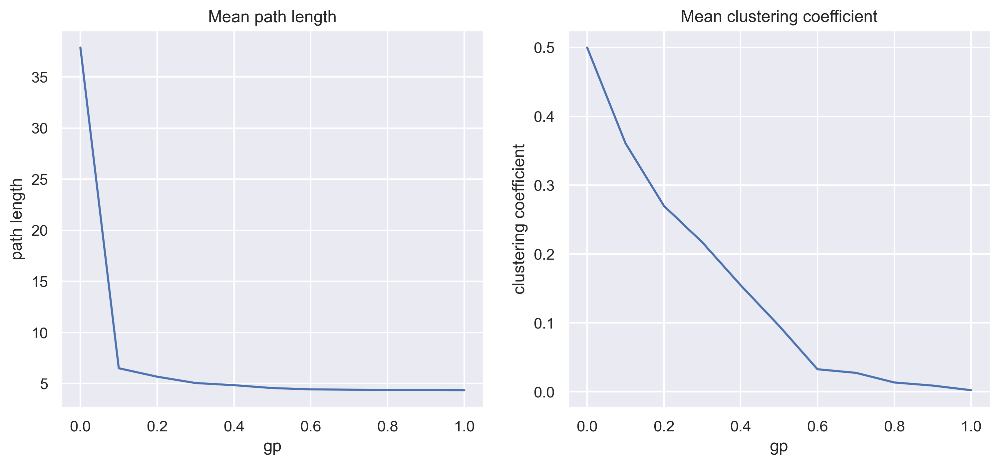

In [52]:
random.seed(seedno)
n = 300
d = 4

sw_metrics = pd.DataFrame()
for gp in np.arange(0, 1.01, 0.1):
    SW_temp = nx.watts_strogatz_graph(n, d, gp, seed=seedno)
    sw_metrics = sw_metrics.append(
        {
            'gp': gp,
            'path length': np.mean(compute_path_lengths(SW_temp)),
            'clustering coefficient': np.mean(list(cc(SW_temp).values()))
        },
        ignore_index=True)

fig, axs = plt.subplots(ncols=2, figsize=(12, 5))
sns.lineplot(data=sw_metrics, x='gp', y='path length',
             ax=axs[0]).set_title('Mean path length')
sns.lineplot(data=sw_metrics, x='gp', y='clustering coefficient',
             ax=axs[1]).set_title('Mean clustering coefficient')

Παρατηρούμε πως το μέσο μήκος μονοπατιών μειώνεται ραγδαία μέχρι το $g_p = 0.1$  ενώ μετά μειώνεται ομαλά μέχρι το $g_p = 4.9$. Ταυτόχρονα ο Σ.Ο. μειώνεται με γρήγορο ρυθμό μέχρι και το $g_p = 0.6$ και απο εκεί πιο μειώνεται πιο ομαλά. Για $g_p = 0$ έχουμε πλέγμα (REG) με αρχικό βαθμό 4, οπότε έχουμε μεγάλο μέσο μήκος μονοπατιού με μεγάλη διακύμανση. Για τιμές $g_p \in[0.1, 0.5]$ το παρατηρούμε πως ο γράφος συμπερυφέρεται σαν τον SW. Ενώ για $g_p = 1$ εχουμε τυχαίο γράφημα.

### Z) Αναγνώριση τύπου πραγματικού δικτύου 

Για το πραγματικό δίκτυο που δίνεται στο αρχείο got.txt  και αφορά στις αλληλεπιδράσεις των χαρακτήρων του Game of Thrones στον πρώτο κύκλο επεισοδίων (https://github.com/mathbeveridge/gameofthrones) να βρεθούν:</p>
<ol>
    <li>Η κατανομή του βαθμού κόμβου και ο μέσος βαθμός.</li>
    <li>Η κατανομή του συντελεστή ομαδοποίησης και ο μέσος συντελεστής ομαδοποίησης.</li>
    <li>Το μέσο μήκος μονοπατιού.</li>
</ol>
<p style=text-align:justify>Να οπτικοποιηθεί το δίκτυο. Να συγκριθούν τα αποτελέσματα σε σχέση με αυτά των συνθετικών τοπολογιών. Να χαρακτηρίσετε τον τύπο της τοπολογίας με βάση τους τύπους δικτύων που εξετάστηκαν στις ενότητες B, Γ.</p>

In [53]:
G_got = nx.Graph()  #the graph of the GOT characters
with open('got.txt') as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    line_count = 0
    for row in csv_reader:
        G_got.add_edge(row[0], row[1], weight=row[2])
        line_count += 1

#### Κατανομή του βαθμού κόμβου και μέσος βαθμός

In [54]:
GOT_degrees = find_degree(G_got)
GOT_degrees = list(GOT_degrees.values())

[]

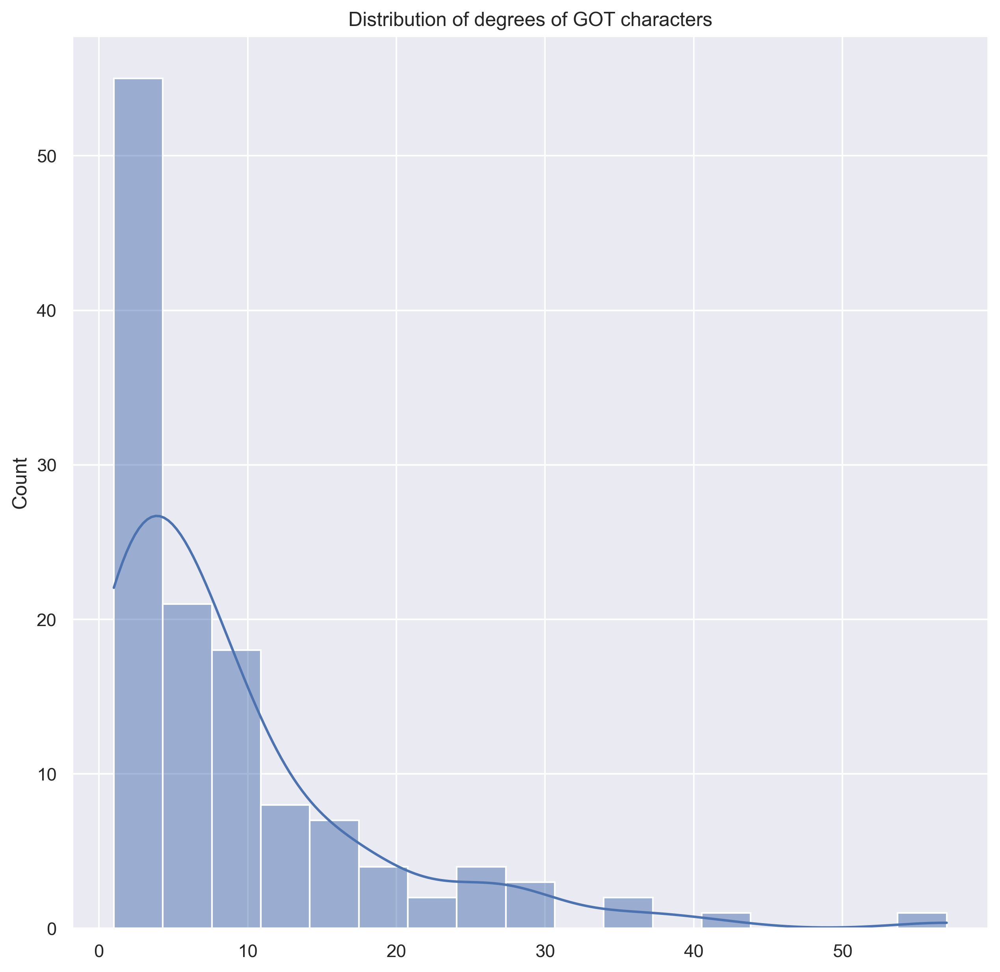

In [55]:
sns.histplot(data=GOT_degrees,
             kde=True).set_title('Distribution of degrees of GOT characters')
plt.plot()

In [56]:
print("Mean degree of GOT characters is {:.4f}".format(np.mean(GOT_degrees)))

Mean degree of GOT characters is 8.7143


#### Κατανομή του συντελεστή ομαδοποίησης και μέσος συντελεστής ομαδοποίησης

[]

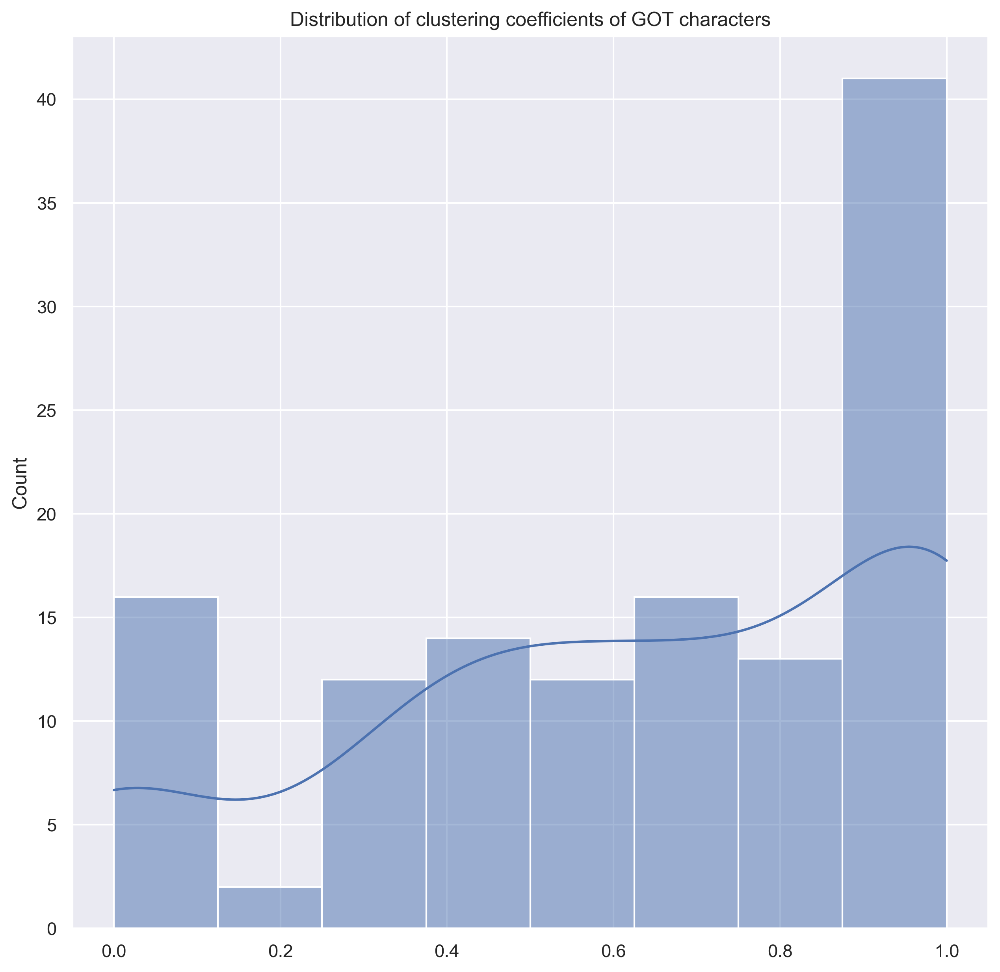

In [57]:
c_coef = list(cc(G_got).values())

sns.histplot(data=c_coef, kde=True).set_title(
    'Distribution of clustering coefficients of GOT characters')
plt.plot()

In [58]:
print("Mean clustering coefficient of GOT characters is {:.4f}".format(
    np.mean(c_coef)))

Mean clustering coefficient of GOT characters is 0.6297


#### Μέσο μήκος μονοπατιού

In [59]:
mean_path_length = np.mean(compute_path_lengths(G_got))
print('Mean path length of GOT characters is {:.4f}'.format(mean_path_length))

Mean path length of GOT characters is 2.6447


#### Οπτικοποίηση δικτύου

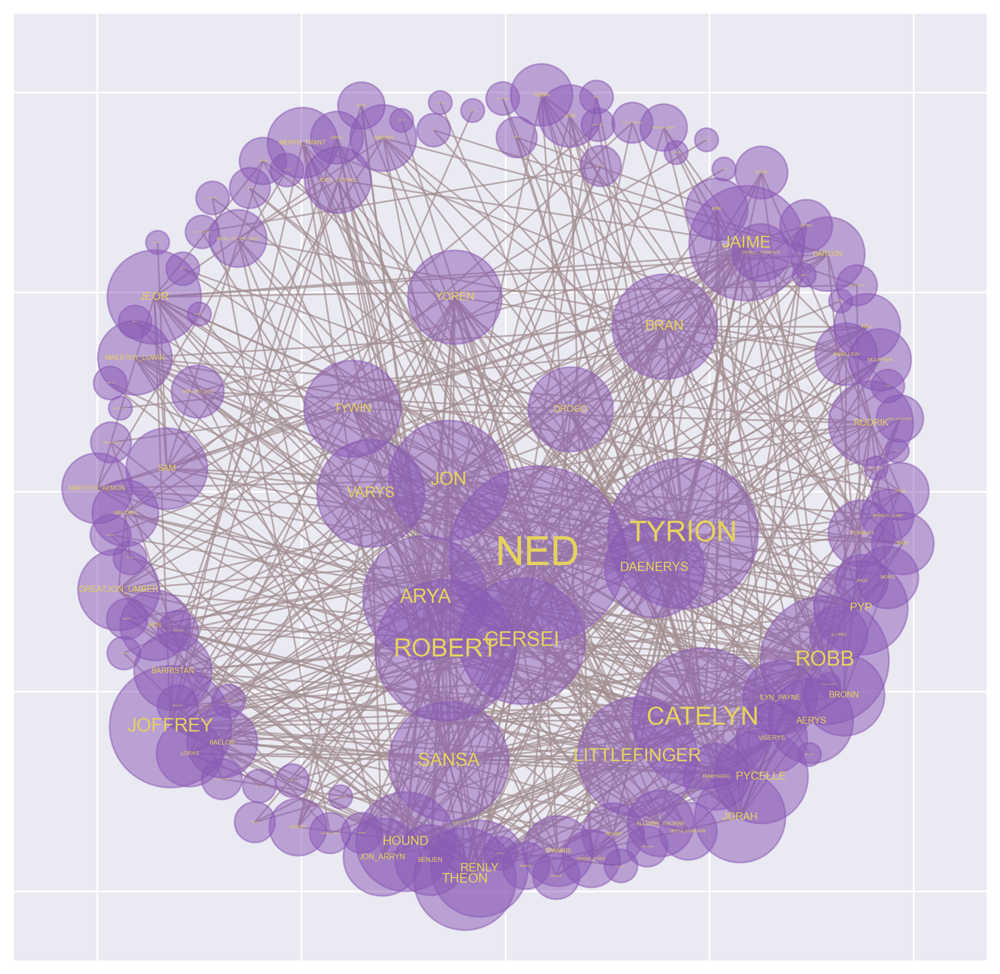

In [60]:
weights = dict(G_got.degree)

pos = nx.spring_layout(G_got, k=5)
nodes = nx.draw_networkx_nodes(G_got,
                               pos,
                               nodelist=weights.keys(),
                               node_size=[v * 180 for v in weights.values()],
                               alpha=0.5,
                               node_color='#8a5ab6')

edges = nx.draw_networkx_edges(G_got, pos, edge_color='#a38f91', alpha=0.7)

for n, i in {n: n for n in sorted(weights, key=weights.get, reverse=True)
            }.items():
    n_labels = nx.draw_networkx_labels(G_got,
                                       pos, {n: n},
                                       font_size=0.4 * weights[n],
                                       font_color='#e6d15f')

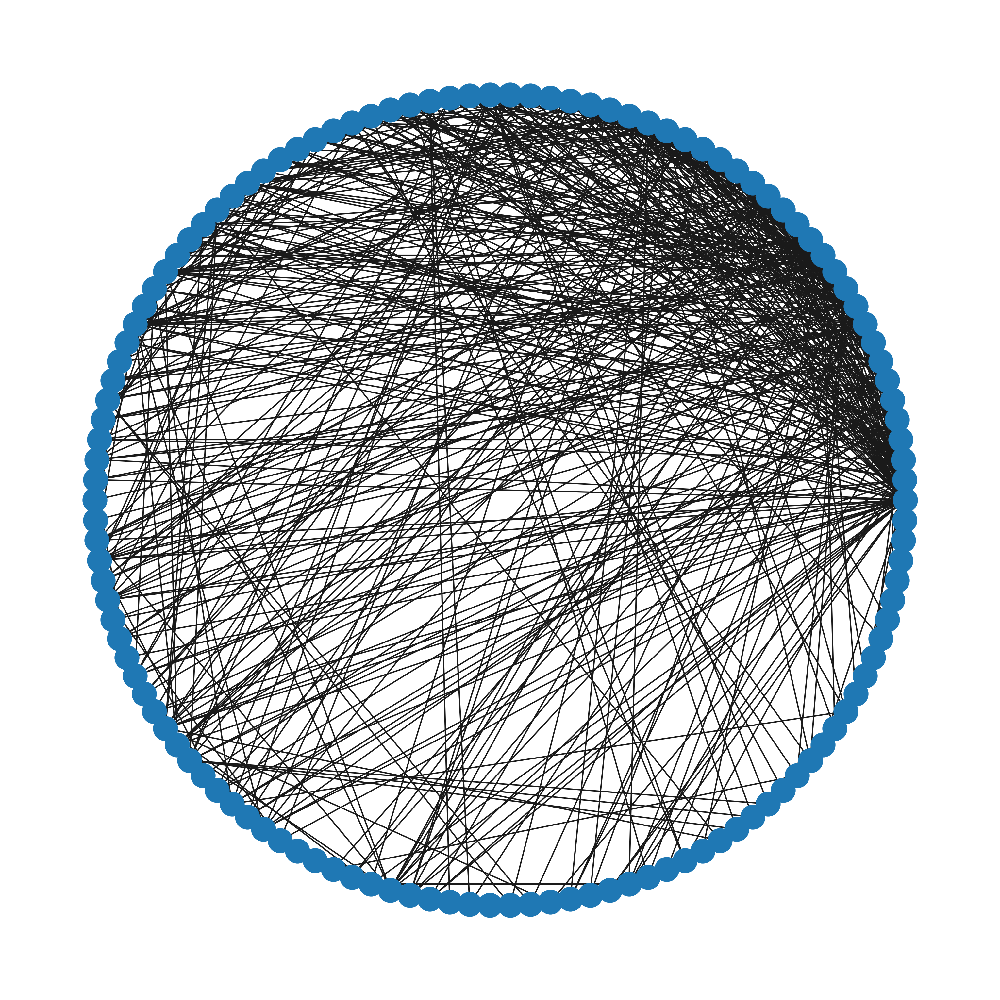

In [61]:
nx.draw_circular(G_got)

#### Χαρακτηρισμός αποτελεσμάτων

Παραπάνω φαίνονται τα αποτελέσματα για την κατανομή της κεντρικότητας βαθμού, την μέση κεντρικότητα βαθμού, την κατανομή του συντελεστή ομαδοποίησης, τον μέσο συντελεστή ομαδοποίησης και το μέσο μήκους μονοπατιού για τον γράφο των αλληλεπιδράσεων των χαρακτήρων της σειράς GOT. Μας ζητείτε, επίσης, να οπτικοποιήσουμε το δίκτυο και το κάνουμε δύο φορές στον γράφος μας, μια με τους κόμβους να έχουν ανάλογο μέγεθος με το centrality και μια με την βοήθεια της συνάρτησης draw_circular, οπότε θα δούμε ότι ο γράφος μοιάζει πάρα πολύ με γράφο που αντιστοιχεί σε Scale-Free (SF) δίκτυο. Αυτό το παρατηρούμε καθότι βλέπουμε πως υπάρχει ένα μικρό ποσοστό κόμβων με μεγάλο βαθμό, ενώ οι περισσότεροι άλλοι κόμβοι του γράφου έχουν μικρό βαθμό, κάτι το οποίο είναι χαρακτηριστικό των Scale-Free δικτύων. Αυτό μπορούμε να το επαληθεύσουμε κοιτώντας και τα αποτελέσματα που εμφανίζονται παραπάνω. Καταρχάς, παρατηρώντας την κατανομή του degree centrality, βλέπουμε πως ακολουθεί την κατανομή Power Law, όπως και ακολουθούν τα Scale-Free δίκτυα, δηλαδή ότι έχει πολλούς κόμβους με μικρή κεντρικότητα βαθμού και ελάχιστους με μεγάλη, οδηγώντας έτσι στο να έχουμε μικρή μέση κεντρικότητα βαθμού (αν παρατηρήσουμε τα Scale-Free δίκτυα που δημιουργήσαμε παραπάνω θα δούμε πως και αυτά ακολουθούν την Power Law κατανομή, όπως κάνει και το δικό μας δίκτυο τώρα). Στην συνέχεια, παρατηρώντας την κατανομή του Σ.Ο. και τον μέσο Σ.Ο. βλέπουμε γενικά πως οι περισσότεροι κόμβοι έχουν πολύ μεγάλο Σ.Ο., με αποτέλεσμα να είναι και μεγάλος ο μέσος Σ.Ο., κάτι το οποίο συμβαδίζει με την θεωρία, εφόσον ξέρουμε πως τα Scale-Free δίκτυα έχουν μεγάλο Σ.Ο. (5 φορές μεγαλύτερος από τον Σ.Ο. των RG σύμφωνα με τις διαφάνειες του μαθήματος). Τέλος, αν παρατηρήσουμε το μέσο μήκος μονοπατιού θα δούμε πως είναι μικρό, κάτι το οποίο επίσης επαληθεύει το γεγονός πως το δίκτυό μας είναι Scale-Free, εφόσον από την θεωρία ξέρουμε πως τα Scale-Free δίκτυα έχουν γενικά μικρό μέσο μήκος μονοπατιού. Άρα, λοιπόν, τόσο από τα αποτελέσματα που παρουσιάσαμε παραπάνω, όσο και από την οπτικοποίηση του γράφου, μπορούμε να επιβεβαιώσουμε πως το δίκτυο που μας δίνεται είναι Scale-Free (αυτό το καταλαβαίνουμε κιόλας εφόσον αν συγκρίνουμε τα αποτελέσματα και τις κατανομές του δικτύου μας με αυτά των σύνθετων τοπολογιών πάνω, θα καταλάβουμε πάλι πως μοιάζουν με αυτά που αναφέρονται σε Scale-Free δίκτυα, και όχι στα άλλα).

#### Ποιοι ήταν οι 5 κεντρικότεροι χαρακτήρες του πρώτου κύκλου επεισοδίων ως προς το βαθμό, την εγγύτητα και την ενδιαμεσικότητα ? 

In [62]:
G_got_degree = [{
    'Name': name,
    'Degree': centrallity
} for name, centrallity in find_degree(G_got).items()]

G_got_closeness = [{
    'Name': name,
    'Closeness': centrallity
} for name, centrallity in find_closeness(G_got).items()]

G_got_betweenness = [{
    'Name': name,
    'Betweenness': centrallity
} for name, centrallity in find_betweenness(G_got).items()]

G_got_degree = pd.DataFrame(G_got_degree)
G_got_closeness = pd.DataFrame(G_got_closeness)
G_got_betweenness = pd.DataFrame(G_got_betweenness)
dfs = [G_got_degree, G_got_closeness, G_got_betweenness]
centrallities = reduce(lambda left, right: pd.merge(left, right, on='Name'),
                       dfs)

In [63]:
print("5 most central characters in GOT")
side_by_side([
    centrallities.nlargest(5, 'Degree'),
    centrallities.nlargest(5, 'Closeness'),
    centrallities.nlargest(5, 'Betweenness')
], ["By Degree", 'By Closeness', 'By Betweenness'])

5 most central characters in GOT


By Degree By Closeness By Betweenness 
 
 
 Name 
 Degree 
 Closeness 
 Betweenness 
 
 
 
 
 NED 
 57 
 0.628141 
 0.303280 
 
 
 TYRION 
 41 
 0.543478 
 0.163027 
 
 
 ROBERT 
 36 
 0.553097 
 0.110395 
 
 
 CATELYN 
 36 
 0.550661 
 0.118284 
 
 
 ROBB 
 30 
 0.512295 
 0.080001 
 
 
 
 
 
 Name 
 Degree 
 Closeness 
 Betweenness 
 
 
 
 
 NED 
 57 
 0.628141 
 0.303280 
 
 
 ROBERT 
 36 
 0.553097 
 0.110395 
 
 
 CATELYN 
 36 
 0.550661 
 0.118284 
 
 
 TYRION 
 41 
 0.543478 
 0.163027 
 
 
 JON 
 26 
 0.518672 
 0.085336 
 
 
 
 
 
 Name 
 Degree 
 Closeness 
 Betweenness 
 
 
 
 
 NED 
 57 
 0.628141 
 0.303280 
 
 
 TYRION 
 41 
 0.543478 
 0.163027 
 
 
 CATELYN 
 36 
 0.550661 
 0.118284 
 
 
 ROBERT 
 36 
 0.553097 
 0.110395 
 
 
 DAENERYS 
 18 
 0.456204 
 0.101431